In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri
import doubletdetection as dd
from gseapy.plot import barplot, dotplot
import os, sys
import gseapy as gp
from anndata import AnnData

import scipy.stats
import diffxpy.api as de
import anndata
from batchglm.api.models.tf1.glm_nb import Simulator

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()


plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 0   # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white')
sc.logging.print_versions()
sc.logging.print_header()

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
%load_ext rpy2.ipython

%matplotlib inline

plt.rcParams.update({'font.size': 22})

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

-----
anndata     0.7.5
scanpy      1.6.1
sinfo       0.3.1
-----
Crypto                                      3.10.1
OpenSSL                                     20.0.1
PIL                                         8.1.0
aa8f2297d25b4dc6fd3d98411eb3ba53823c4f42    NA
absl                                        NA
anndata                                     0.7.5
anndata2ri                                  1.0.6
appdirs                                     1.4.4
asciitree                                   NA
astunparse                                  1.6.3
backcall                                    0.2.0
backports                                   NA
batchglm                                    v0.7.4
bcrypt                                      3.2.0
beta_ufunc                                  NA
binom_ufunc                                 NA
bioservices                                 1.7.11
boto3                                       1.17.107
botocore                                    1

In [2]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
#.libPaths("/home/dan/R/x86_64-pc-linux-gnu-library/4.03")
#Sys.setenv(R_INSTALL_STAGED = FALSE)

#sudo apt-get install aptitude

#sudo apt-get install libcurl4-openssl-dev

#sudo apt-get install libxml2-dev

# Load all the R libraries we will be using in the notebook
library(scran)
library(RColorBrewer)
#library(slingshot)
#library(monocle)
#library(gam)
library(clusterExperiment)
library(ggplot2)
library(plyr)
library(MAST)
#library(scCB2)
#library(DropletUtils)
library(Seurat)
library(NMF)
library(BiocFileCache)

In [4]:
import pickle

# Getting back the objects:
with open('adata_cluster_annotations2.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata = pickle.load(f)

In [4]:
adata.var_names

Index(['EGFP3UTR', 'EGFP', 'CreERT2', 'EYFP', 'hETV4', 'Xkr4', 'Rp1', 'Sox17',
       'Mrpl15', 'Lypla1',
       ...
       'Ccl21c', 'CR974586.5', 'AC132444.1', 'Csprs', 'AC125149.3',
       'AC168977.2', 'AC168977.1', 'AC149090.1', 'CAAA01118383.1',
       'CAAA01147332.1'],
      dtype='object', length=19854)

In [5]:
remove_hETV4_list = [name for name in adata.var_names != 'hETV4']
adata = adata[:, remove_hETV4_list]

/home/dan/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [6]:
adata.var_names

Index(['EGFP3UTR', 'EGFP', 'CreERT2', 'EYFP', 'Xkr4', 'Rp1', 'Sox17', 'Mrpl15',
       'Lypla1', 'Gm37988',
       ...
       'Ccl21c', 'CR974586.5', 'AC132444.1', 'Csprs', 'AC125149.3',
       'AC168977.2', 'AC168977.1', 'AC149090.1', 'CAAA01118383.1',
       'CAAA01147332.1'],
      dtype='object', length=19853)

In [7]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 19853


Trying to set attribute `.var` of view, copying.


Number of genes after cell filter: 19802


In [8]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_cluster_annotations3.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata, f)

In [3]:
import pickle

# Getting back the objects:
with open('adata_cluster_annotations3.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata = pickle.load(f)

In [4]:
mycolormap_26 = ["#66cdaa","#0054b4","#966fd6","#aec6cf","red",
                "#ffb347","#e5aa70","#db7093","#cc99a2", "#03c03c",
                "#24F4FF", "#5a5a97", "#5b5da7", "#caae6b", "pink",
                 "#ba4747",  "yellow", "#555f6d", "gray", "#cc99a2",
                "#6f9dab", "#557100", "#caae6b", "#f1b929", "orange"]

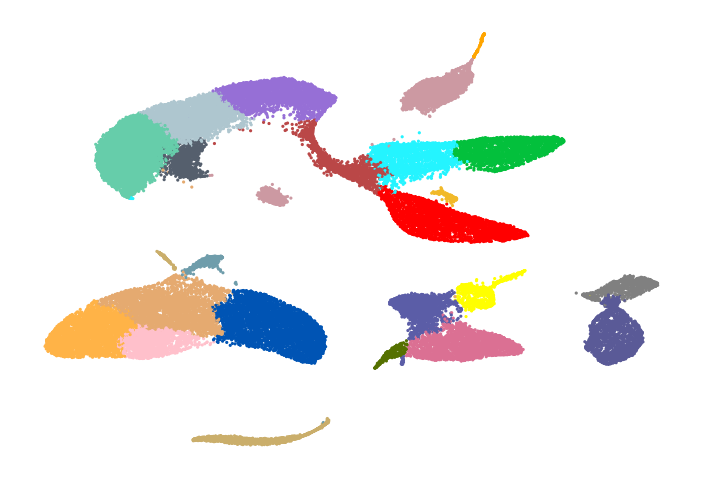

In [5]:
sc.pl.umap(adata, color='leiden_r1', size=10, legend_loc=None, 
           title = '', frameon=False,
           palette = mycolormap_26, 
           show = True, save = 'cluster_name4.pdf')

A cytotoxic T cell is a T lymphocyte that kills cancer cells, virally infected cells and cells that are under damage. Most T lymphocytes express a subset of surface markers such as CD8, CD45(Ptprc) and CD54(Icam1). CD28 expresses on the surface of T cells and provide co-stimulatory signals required for T cell activation.

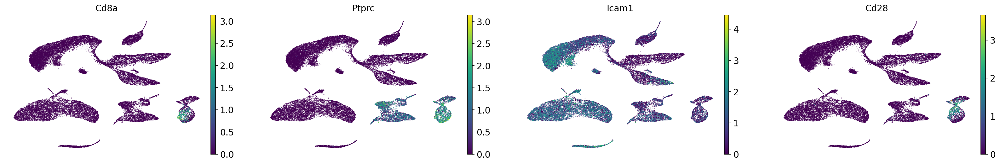

In [28]:
sc.pl.umap(adata, color=['Cd8a','Ptprc','Icam1','Cd28'], frameon=False, 
           color_map=plt.cm.viridis, save ='Tcellmarkers.pdf')

Highlighted helper T cell marker antibodies: CD4 antibodies, CXCR3 antibodies (Th1), CCR4 antibodies (Th2), CCR6 antibodies (Th17), CCR10 antibodies (Th22)

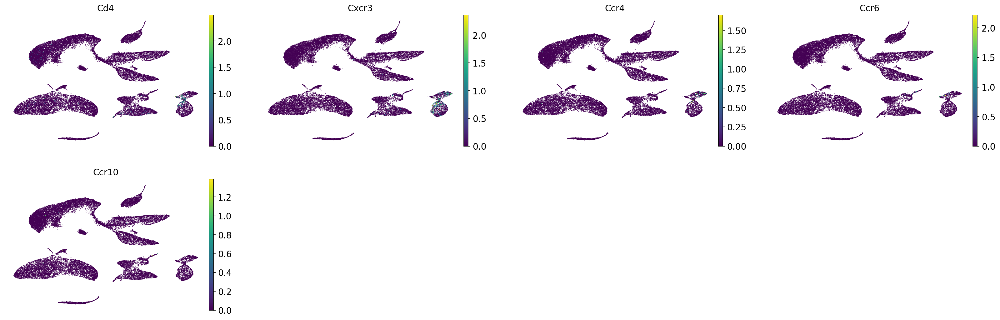

In [17]:
sc.pl.umap(adata, color=['Cd4','Cxcr3','Ccr4', 'Ccr6', 'Ccr10'], frameon=False, 
           color_map=plt.cm.viridis, save ='Tcellmarkers2.pdf')

Tregs are most commonly identified as CD3+CD4+CD25(Il2ra)+FoxP3+ cells in both mice and humans. 

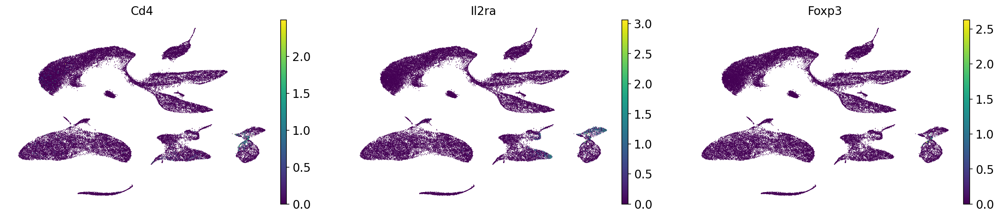

In [22]:
sc.pl.umap(adata, color=['Cd4','Il2ra', 'Foxp3'], frameon=False, 
           color_map=plt.cm.viridis, save ='Tcellmarkers3.pdf')

`adata.X` is already scaled

In [25]:
np.mean(adata.X, axis = 0)

array([ 3.4551475e-05,  2.3585108e-05,  6.9353172e-07, ...,
       -4.3403111e-07,  9.7977681e-06,  4.2815241e-06], dtype=float32)

In [27]:
np.std(adata.X, axis = 0)

array([0.9998732 , 0.99993753, 1.0002148 , ..., 0.99982184, 0.9999781 ,
       0.99995697], dtype=float32)

In [30]:
Tc_genes = ['Cd8a','Ptprc','Icam1','Cd28']
Th_genes = ['Cd4','Cxcr3','Ccr4', 'Ccr6', 'Ccr10']
Treg_genes = ['Cd4','Il2ra', 'Foxp3']

In [31]:
adata.obs['Tc_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(Tc_genes)], axis = 1)
adata.obs['Th_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(Th_genes)], axis = 1)
adata.obs['Treg_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(Treg_genes)], axis = 1)

In [35]:
adata_Tcells = adata[adata.obs['leiden_r1'].isin(['T_cells_1', 'T_cells_2'])]

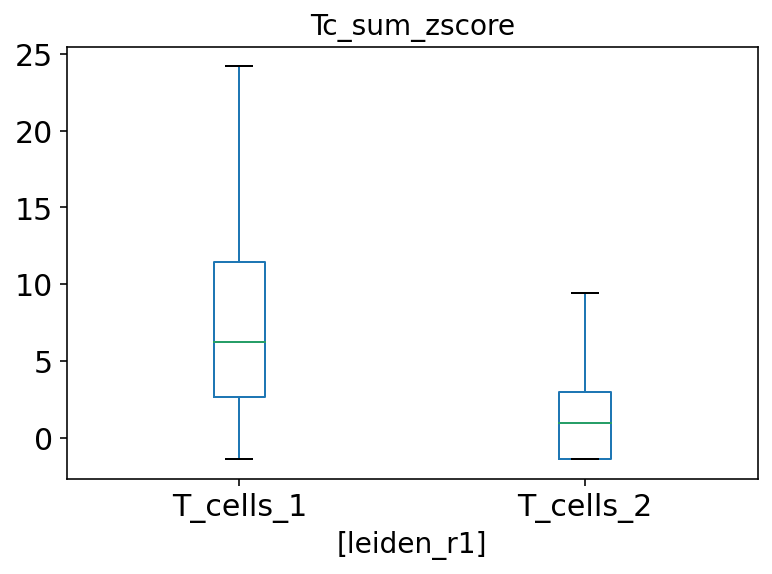

In [42]:
adata_Tcells.obs.loc[:,['leiden_r1','Tc_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/Tc_sum_zscore.pdf")

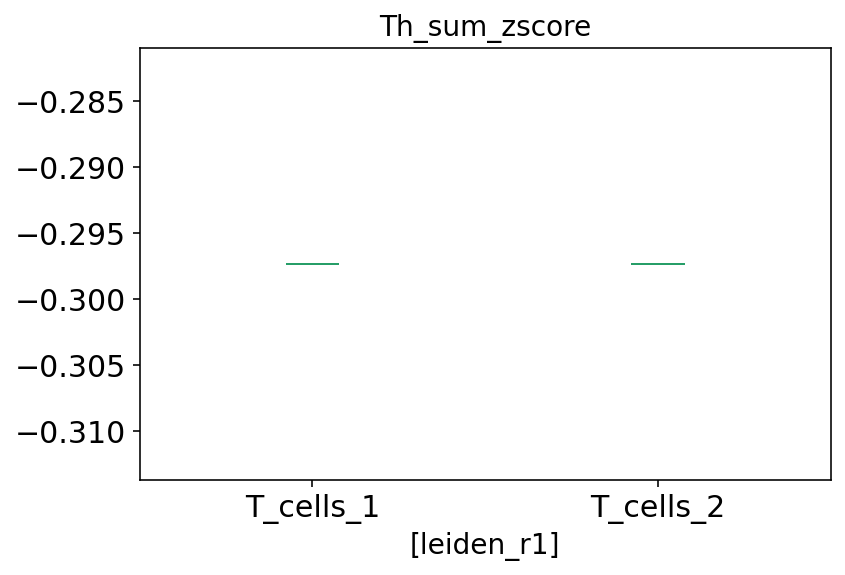

In [43]:
adata_Tcells.obs.loc[:,['leiden_r1','Th_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15, showfliers=False)
plt.suptitle('')
plt.savefig("./figures/Th_sum_zscore.pdf")

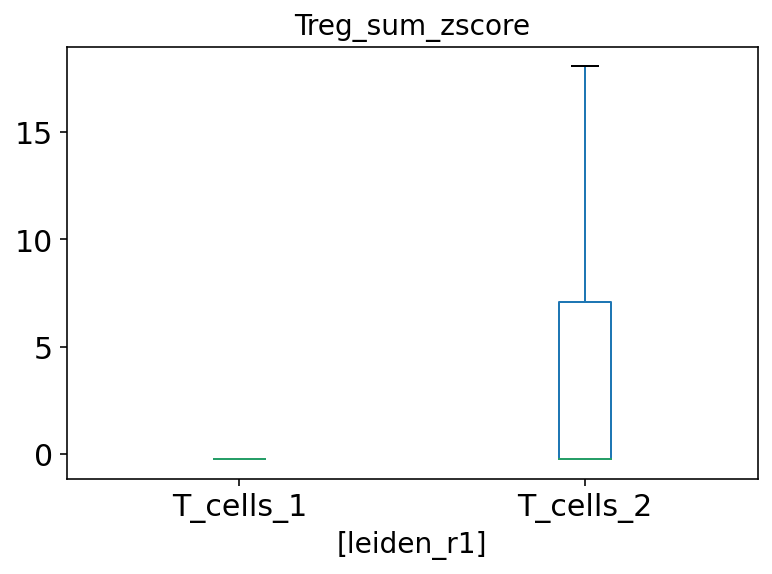

In [44]:
adata_Tcells.obs.loc[:,['leiden_r1','Treg_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15, showfliers=False)
plt.suptitle('')
plt.savefig("./figures/Treg_sum_zscore.pdf")

M1 macrophage: Jablonski_PlosOne_2015
IL1b
IL6
IL12b
Inhba
TNFa
Nos2
CCR7
slc7a2
Cxcl9
Serpinb2
Ptgs2
Cxcl3
Il1a
CD38
Lcn2
Ppap2a
Ptges
CD200
Fpr2
Gpr18

M2 macrophage: Jablonski_PlosOne_2015
Arg1
Mgl2
Retnla
Ear11
Tmem26
Slc7a2
Tmem26
Socs2
Ch25h
Chi3l3
Slcl7a2
Flt1
Slcl7a2

Pdcd1lg2
Chi3l4
Mcf2l
Ccl22
Cdh1
Ccl17
Itgb3
AA467197
Il4i1
Aqp9
Egr2


MDSC (not mutually exclusive with M1 or M2)
ARG1
CYBB
OLR1
FUT4
CEACAM8
S100A8
S100A9
IL10
TGFb
NOS2
COX2
IDO
STAT3
PTGES2

In [75]:
M1_genes = ['Il1b','Il6','Il12b','Inhba','Tnf','Nos2','Ccr7','Slc7a2','Cxcl9','Serpinb2',
            'Ptgs2','Cxcl3','Il1a','Cd38','Lcn2','Ptges','Cd200','Fpr2','Gpr18']
M2_genes = ['Arg1','Mgl2','Retnla','Tmem26','Slc7a2','Tmem26','Socs2','Ch25h',
            'Flt1','Pdcd1lg2','Mcf2l','Ccl22','Cdh1',
            'Ccl17','Itgb3','Il4i1','Aqp9','Egr2']
MDSC_genes = ['Arg1','Cybb','Olr1','Fut4','S100a8',
              'S100a9','Il10','Tgfb1','Nos2','Stat3','Ptges2']

In [6]:
np.mean(adata.X, axis = 0)

array([ 3.4551475e-05,  2.3585108e-05,  6.9353172e-07, ...,
       -4.3403111e-07,  9.7977681e-06,  4.2815241e-06], dtype=float32)

In [8]:
adata

AnnData object with n_obs × n_vars = 48926 × 19802
    obs: 'sample', 'age', 'batch', 'genotype_age', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'doublet', 'doublet_score', 'S_score', 'G2M_score', 'phase', 'leiden_r1'
    var: 'gene_id', 2, 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'phase_colors', 'leiden', 'leiden_r1_colors', 'rank_genes_r1'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

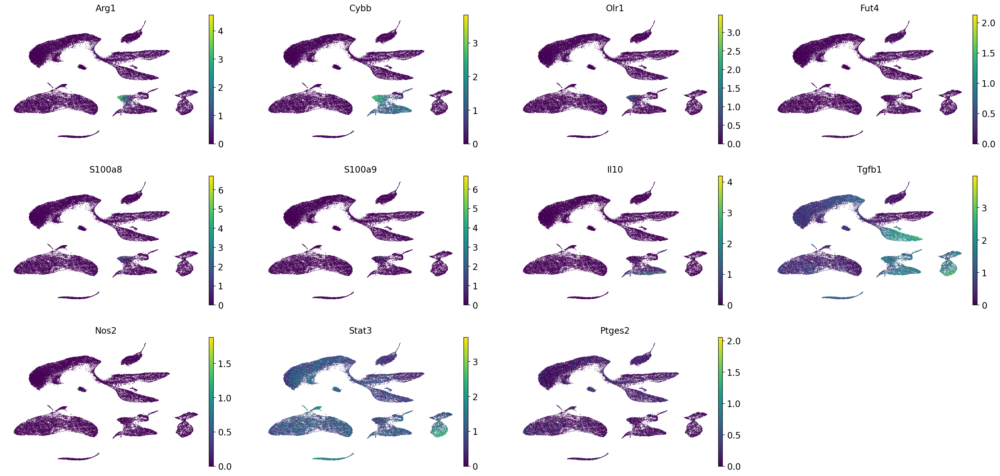

In [76]:
sc.pl.umap(adata, color=MDSC_genes, frameon=False, 
           color_map=plt.cm.viridis, save ='MDSC_genes.pdf')

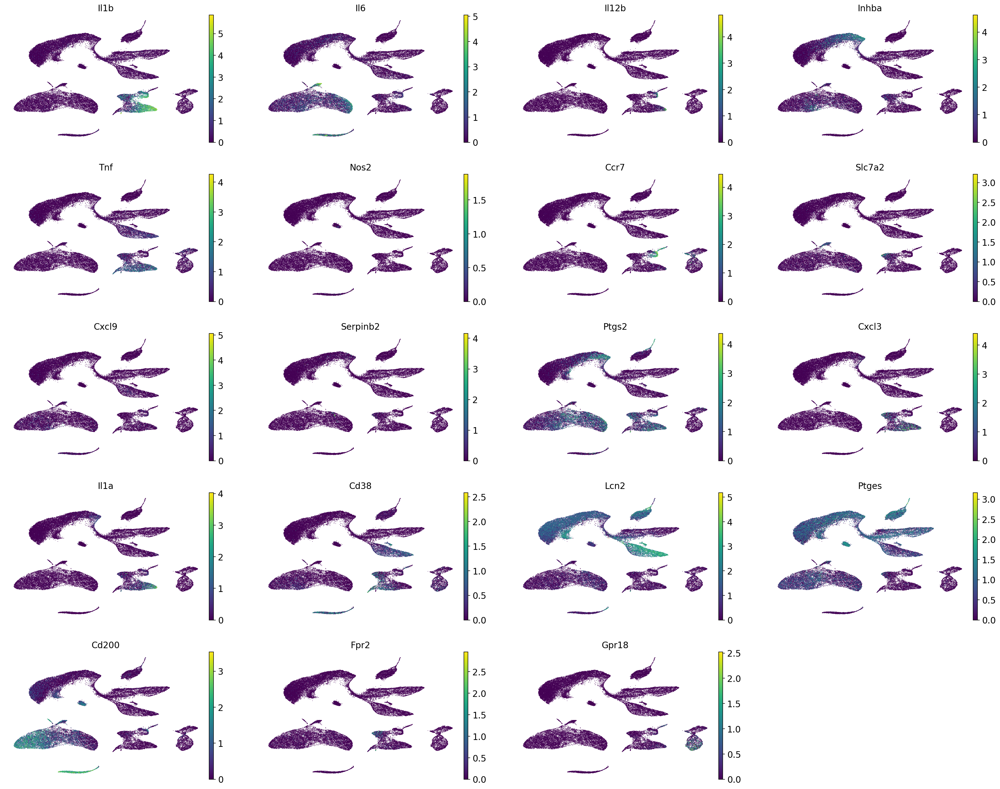

In [53]:
sc.pl.umap(adata, color=M1_genes, frameon=False, 
           color_map=plt.cm.viridis, save ='M1_genes.pdf')

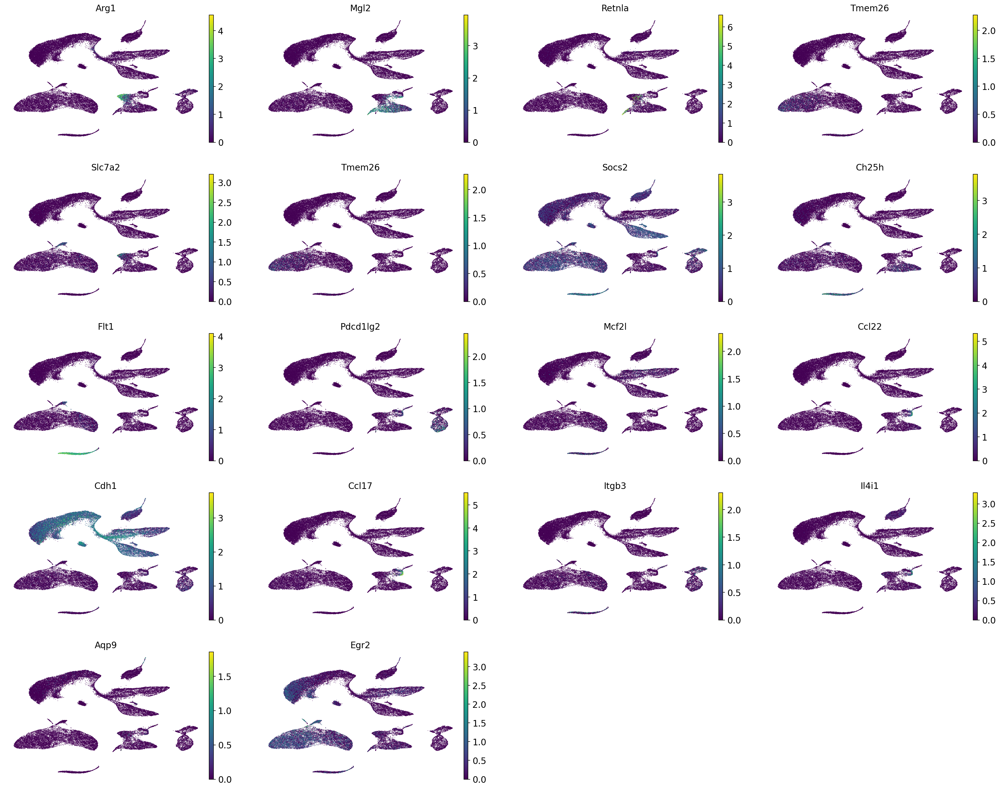

In [66]:
sc.pl.umap(adata, color=M2_genes, frameon=False, 
           color_map=plt.cm.viridis, save ='M2_genes.pdf')

In [77]:
adata.obs['M1_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(M1_genes)], axis = 1)
adata.obs['M2_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(M2_genes)], axis = 1)
adata.obs['MDSC_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(MDSC_genes)], axis = 1)

In [78]:
adata.obs['leiden_r1']

AAACCTGGTGAGTGAC           Macrophage_2
AAATGCCAGAAGATTC           Macrophage_2
AAGACCTGTGAAAGAG              T_cells_1
AATCCAGAGAGGTAGA          Fibroblasts_2
ACACCAAAGCGTGAGT           Macrophage_2
                            ...        
CTCGTCAGTAGAGTGC           Macrophage_2
ATCCGAAAGGTGTGGT-1    Seminal_vesicle_1
CCCAGTTAGGTACTCT      Seminal_vesicle_1
TGCGTGGAGTGGTCCC              Luminal_4
CGTCACTCAAGCTGGA              Luminal_4
Name: leiden_r1, Length: 48926, dtype: category
Categories (25, object): ['Basal_1', 'Fibroblasts_1', 'Basal_2', 'Basal_3', ..., 'Macrophage_3', 'Nerve_cells', 'Luminal_6', 'Seminal_vesicle_2']

In [79]:
adata_Macrophages = adata[adata.obs['leiden_r1'].isin(['Macrophage_1', 'Macrophage_2', 'Macrophage_3'])]

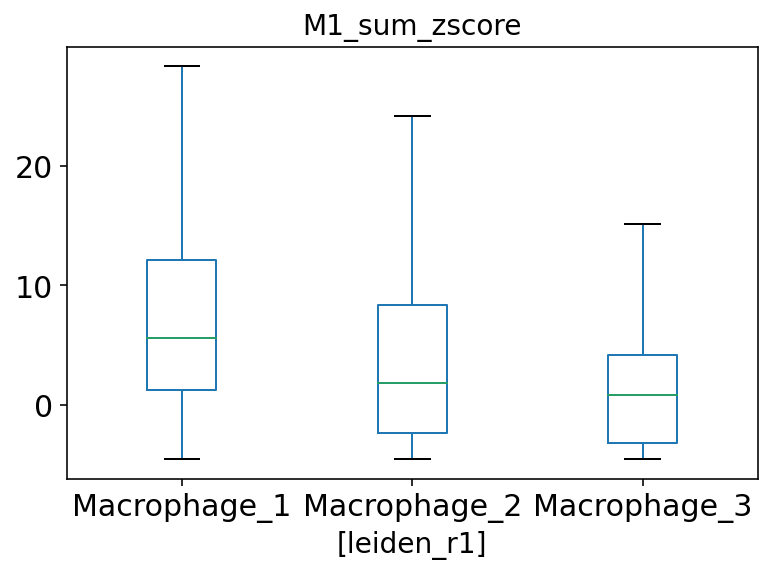

In [80]:
adata_Macrophages.obs.loc[:,['leiden_r1','M1_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/M1_sum_zscore.pdf")

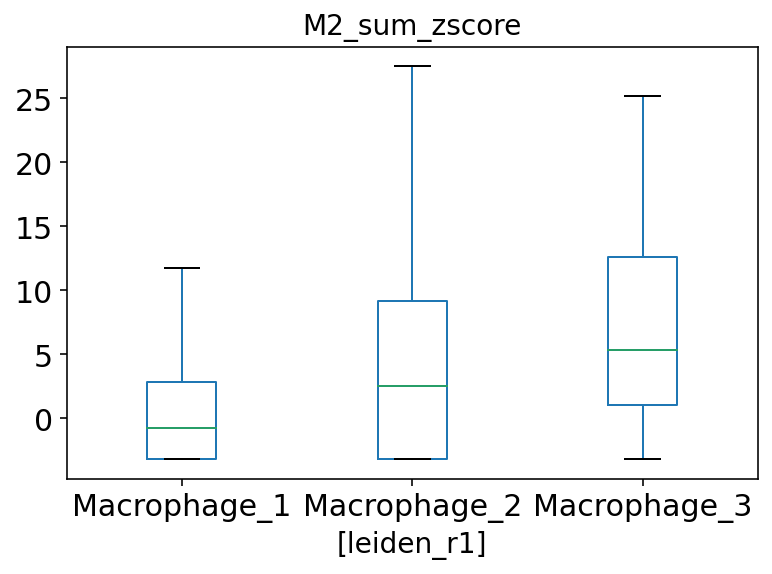

In [81]:
adata_Macrophages.obs.loc[:,['leiden_r1','M2_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/M2_sum_zscore.pdf")

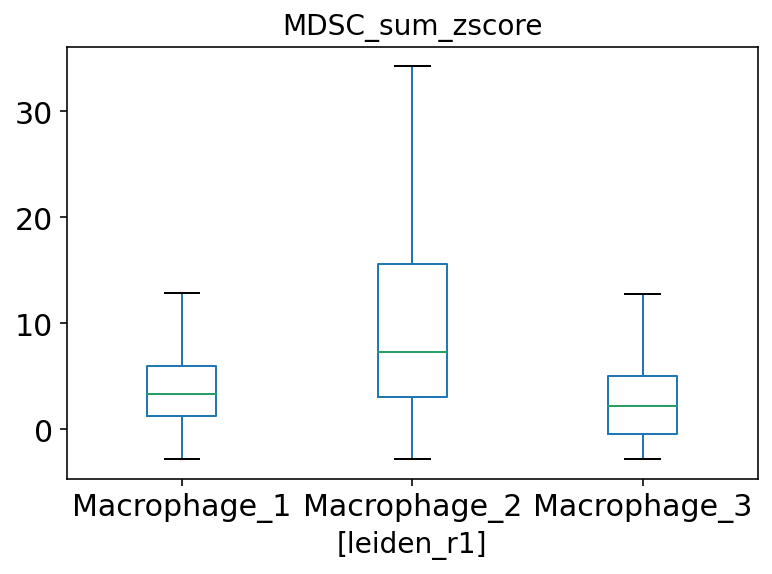

In [82]:
adata_Macrophages.obs.loc[:,['leiden_r1','MDSC_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/MDSC_sum_zscore.pdf")

In [111]:
myofibroblast = ['Acta2', 'Myh11','Acta2', 'Notch3']
smooth_muscle = ['Acta2', 'Notch3']
mesenchymal_1 = ['Col5a2', 'Lama2', 'Zeb1', 'Wnt2', 'Wnt6', 'Wnt10a', 'Rorb'] 
mesenchymal_2 = ['Col5a2', 'Lama2', 'Zeb1', 'Sult1e1', 'Fgf10', 'Rspo1']

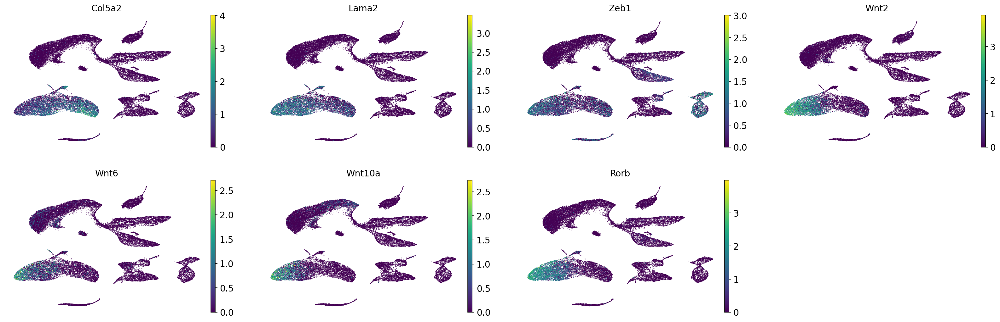

In [104]:
sc.pl.umap(adata, color=mesenchymal_1, frameon=False, 
           color_map=plt.cm.viridis, save ='mesenchymal_1_genes.pdf')

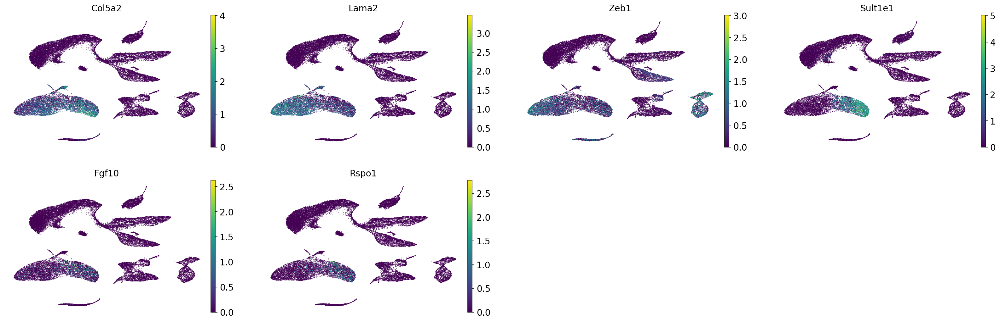

In [112]:
sc.pl.umap(adata, color=mesenchymal_2, frameon=False, 
           color_map=plt.cm.viridis, save ='mesenchymal_2_genes.pdf')

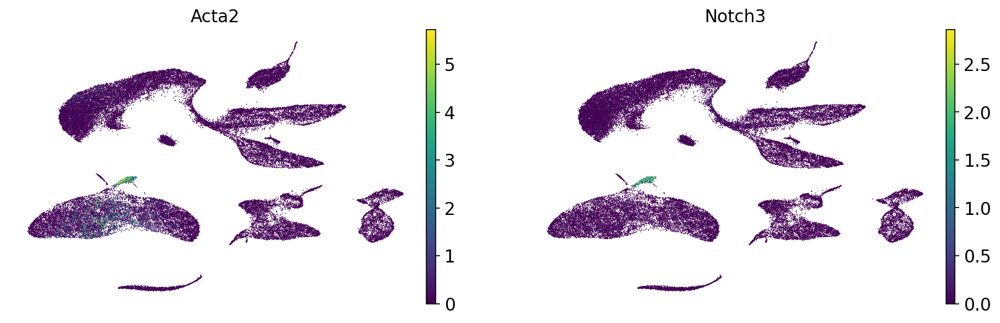

In [106]:
sc.pl.umap(adata, color=smooth_muscle, frameon=False, 
           color_map=plt.cm.viridis, save ='smooth_muscle_genes.pdf')

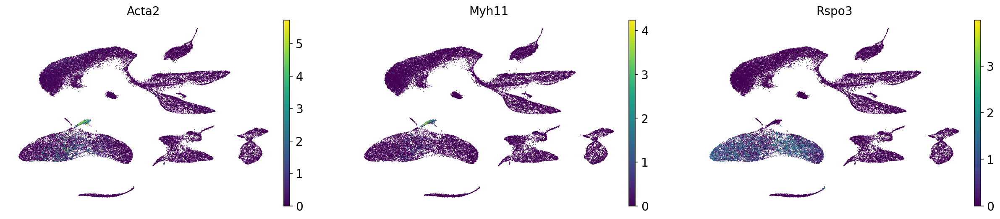

In [107]:
sc.pl.umap(adata, color=myofibroblast, frameon=False, 
           color_map=plt.cm.viridis, save ='myofibroblast_genes.pdf')

In [115]:
adata.obs['mesenchymal_1_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(mesenchymal_1)], axis = 1)
adata.obs['mesenchymal_2_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(mesenchymal_2)], axis = 1)
adata.obs['myo_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(myofibroblast)], axis = 1)

In [6]:
adata_mesenchymal = adata[adata.obs['leiden_r1'].isin(['Fibroblasts_1', 
                                                       'Fibroblasts_2', 'Fibroblasts_3', 'Fibroblasts_4', 'Fibroblasts_5'])]

In [7]:
adata_mesenchymal.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4', 
                                                          'Fibroblasts_5'], inplace=True)

<ipython-input-7-c3f79eaff943>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_mesenchymal.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4',


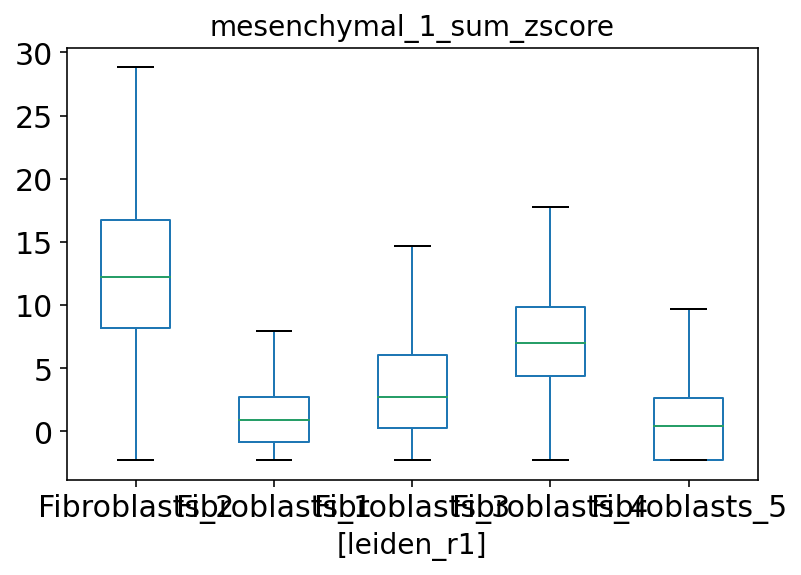

In [119]:
adata_mesenchymal.obs.loc[:,['leiden_r1','mesenchymal_1_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/mesenchymal_1_sum_zscore.pdf")

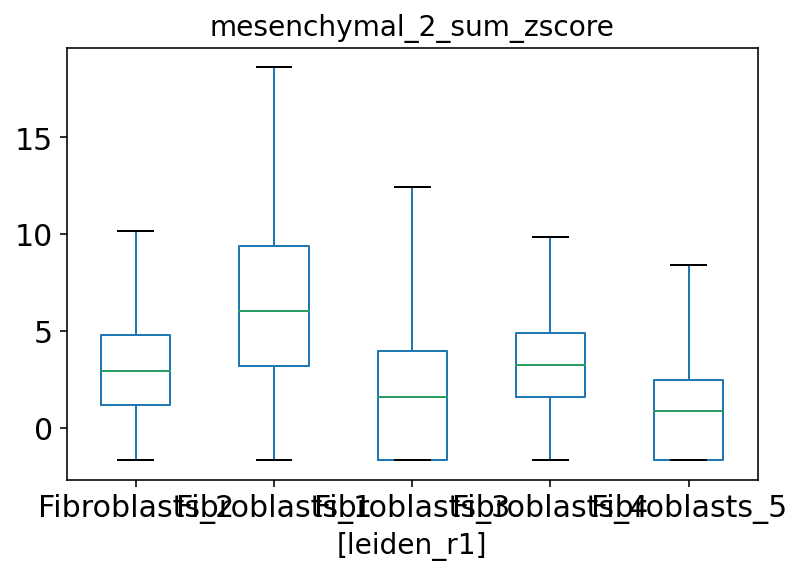

In [120]:
adata_mesenchymal.obs.loc[:,['leiden_r1','mesenchymal_2_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/mesenchymal_2_sum_zscore.pdf")

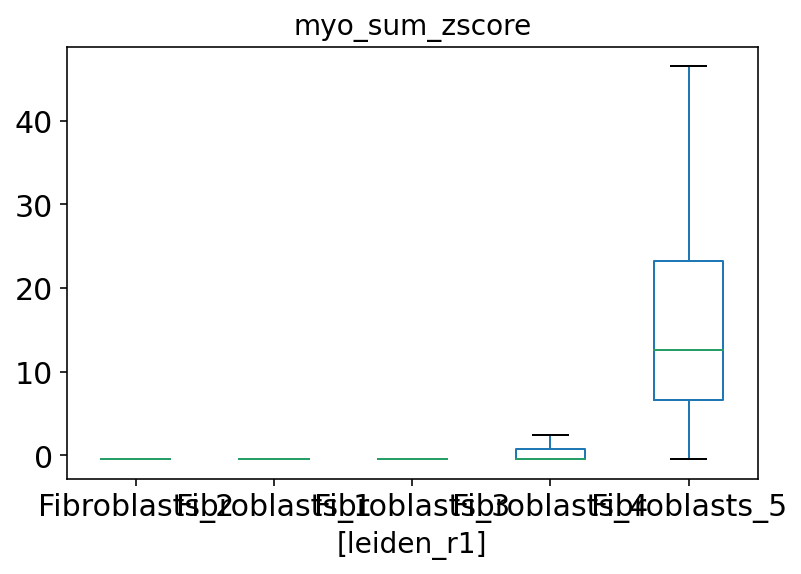

In [121]:
adata_mesenchymal.obs.loc[:,['leiden_r1','myo_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/myo_sum_zscore.pdf")

In [12]:
len(np.sum(adata.X[:,adata.var['gene_id'].isin(['Foxf1'])], axis = 1))

48926

In [14]:
adata.obs['Foxf1_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(['Foxf1'])], axis = 1)

In [18]:
adata.layers['counts'].shape

(48926, 19802)

In [19]:
adata.layers['counts'][:,adata.var['gene_id'].isin(['Foxf1'])]

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

In [13]:
adata.obs['Foxf1_status'] = adata.layers['counts'][:,adata.var['gene_id'].isin(['Foxf1'])] > 0.0
adata.obs['Ar_status'] = adata.layers['counts'][:,adata.var['gene_id'].isin(['Ar'])] > 0.0

In [14]:
adata.obs['Foxf1_status'] = adata.obs['Foxf1_status'].astype("category")
adata.obs['Ar_status'] = adata.obs['Ar_status'].astype("category")

In [15]:
adata_mesenchymal = adata[adata.obs['leiden_r1'].isin(['Fibroblasts_1', 
                                                       'Fibroblasts_2', 'Fibroblasts_3', 'Fibroblasts_4', 'Fibroblasts_5'])]

In [16]:
adata_mesenchymal.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4', 
                                                          'Fibroblasts_5'], inplace=True)

<ipython-input-16-c3f79eaff943>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_mesenchymal.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4',


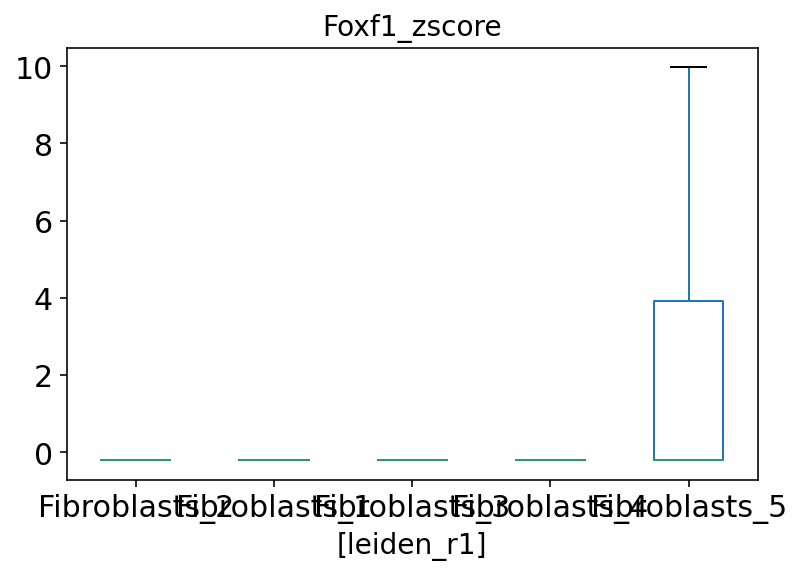

In [17]:
adata_mesenchymal.obs.loc[:,['leiden_r1','Foxf1_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/Foxf1_zscore.pdf")

In [17]:
stroma_foxf1_genes = ['Foxf1', 'Ar']

In [20]:
fcHurdleSig = pd.read_csv('./MAST/Foxf1_status/Foxf1_status_fcHurdleSig.csv')
fcHurdleSig['gene_id']

0      Gm13889
1         Crem
2        Rasd1
3        Eif4e
4         Rgs2
        ...   
99        Igf1
100    Sult1e1
101     Pcolce
102         C3
103       Gpx3
Name: gene_id, Length: 104, dtype: object

luminal 1, Epcam, CD24a, Krt8, Krt18, Nkx3.1, Pbsn; 
luminal 2, Epcam, CD24a, Krt8, Krt18, Psca, Krt4, Tacst2, Ly6a; 
luminal 3 (ionocyte), Epcam, CD24a, Krt8, Krt18, Foxi1, Atp6v1g3, Atp6b1b;

In [12]:
luminal_1 = ['Epcam', 'Cd24a', 'Krt8', 'Krt18', 'Nkx3-1', 'Pbsn'] 
luminal_2 = ['Epcam', 'Cd24a', 'Krt8', 'Krt18', 'Psca', 'Krt4', 'Tacstd2', 'Ly6a'] 
luminal_3 = ['Epcam', 'Cd24a', 'Krt8', 'Krt18', 'Foxi1', 'Atp6v1g3']

In [13]:
LumA = ['Tgm4','Gsdma','Krt8','Cd24a', 'Krt18', 'Nkx3-1', 'Pbsn']
LumL = ['Msmb']
LumV = ['Trpv6']
LumP = ['Ppp1r1b']

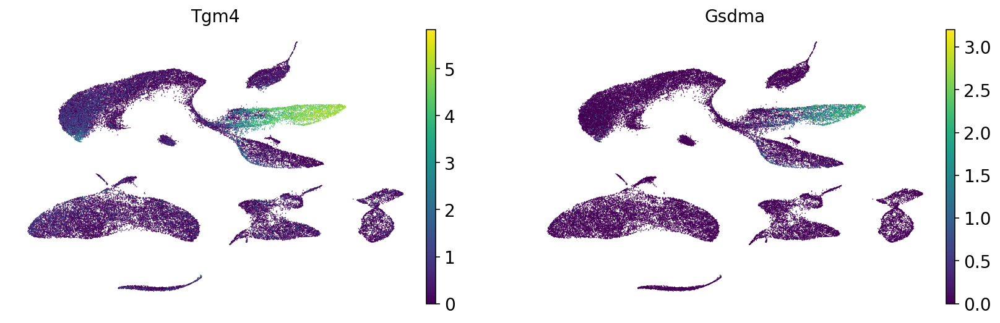

In [171]:
sc.pl.umap(adata, color=LumA, frameon=False, 
           color_map=plt.cm.viridis, save ='LumA_genes.pdf')

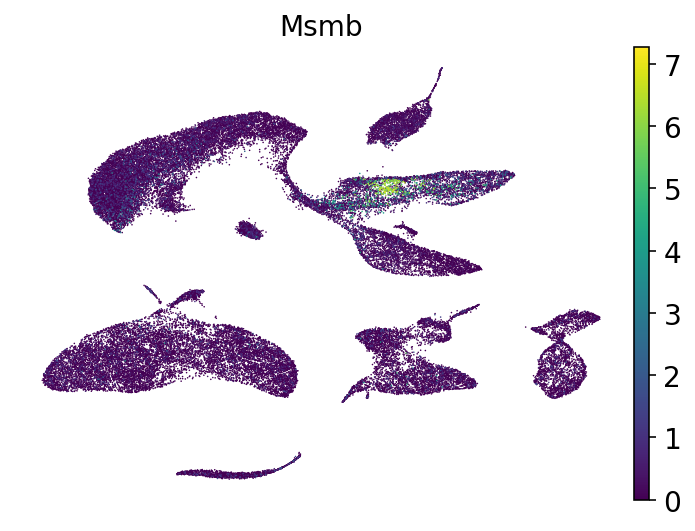

In [164]:
sc.pl.umap(adata, color=LumL, frameon=False, 
           color_map=plt.cm.viridis, save ='LumL_genes.pdf')

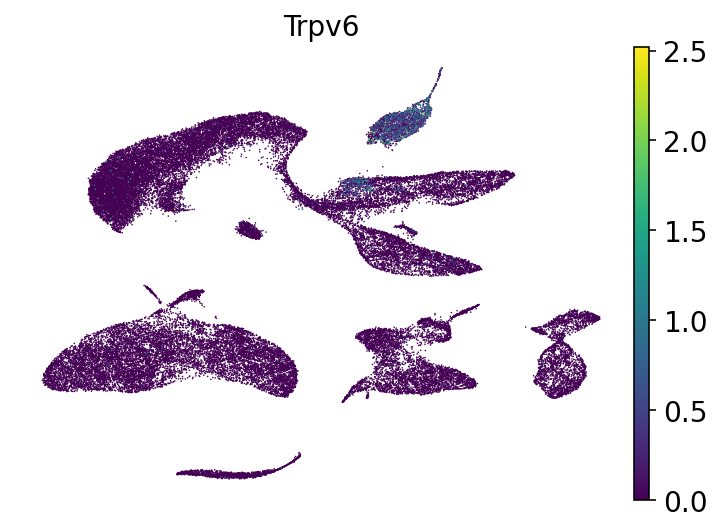

In [144]:
sc.pl.umap(adata, color=LumV, frameon=False, 
           color_map=plt.cm.viridis, save ='LumV_genes.pdf')

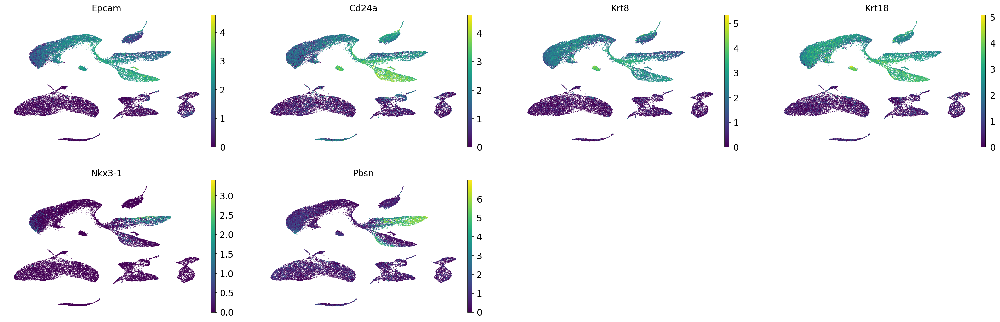

In [125]:
sc.pl.umap(adata, color=luminal_1, frameon=False, 
           color_map=plt.cm.viridis, save ='luminal_1_genes.pdf')

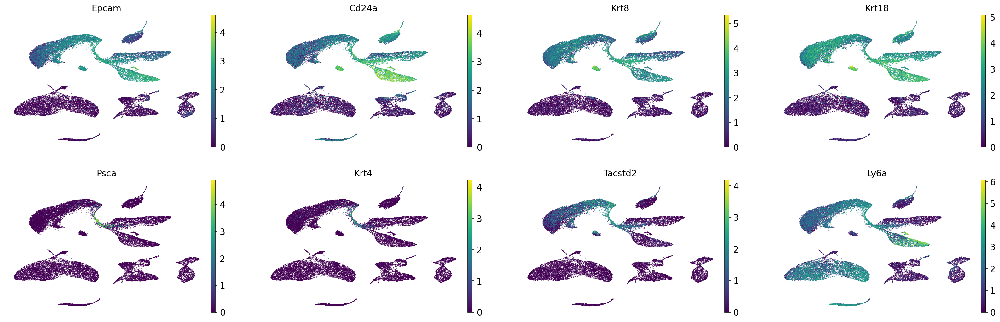

In [128]:
sc.pl.umap(adata, color=luminal_2, frameon=False, 
           color_map=plt.cm.viridis, save ='luminal_2_genes.pdf')

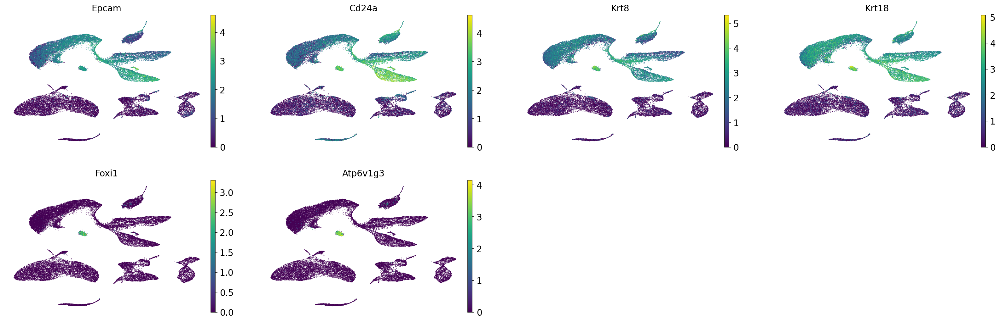

In [131]:
sc.pl.umap(adata, color=luminal_3, frameon=False, 
           color_map=plt.cm.viridis, save ='luminal_3_genes.pdf')

Seminal_vesicle markers:
Pate4
Svs5
Cdo1
Cd52
Serpine2
Svs2
Tspan1


In [9]:
Seminal_vesicle = ['Pate4', 'Svs5', 'Cdo1', 'Cd52', 'Serpine2', 'Svs2', 'Tspan1']

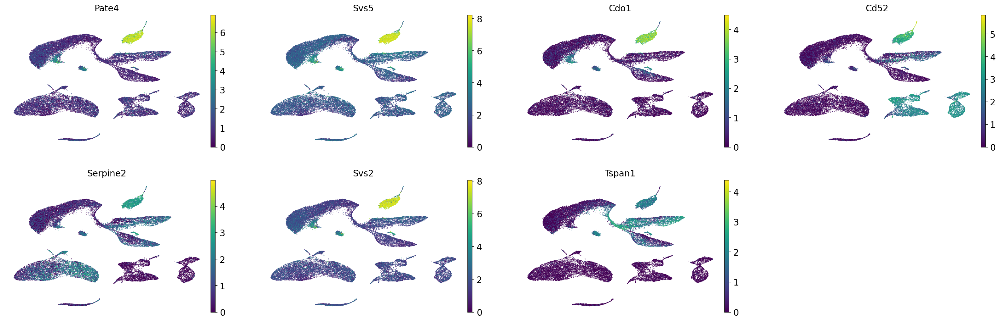

In [10]:
sc.pl.umap(adata, color=Seminal_vesicle, frameon=False, 
           color_map=plt.cm.viridis, save ='Seminal_vesicle_genes.pdf')

In [14]:
adata.obs['luminal_1_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(luminal_1)], axis = 1)
adata.obs['luminal_2_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(luminal_2)], axis = 1)
adata.obs['luminal_3_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(luminal_3)], axis = 1)
adata.obs['Seminal_vesicle_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(Seminal_vesicle)], axis = 1)

In [15]:
adata.obs['LumA_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(LumA)], axis = 1)
adata.obs['LumL_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(LumL)], axis = 1)
adata.obs['LumV_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(LumV)], axis = 1)
adata.obs['LumP_sum_zscore'] = np.sum(adata.X[:,adata.var['gene_id'].isin(LumP)], axis = 1)

In [19]:
adata.obs['leiden_r1']

AAACCTGGTGAGTGAC           Macrophage_2
AAATGCCAGAAGATTC           Macrophage_2
AAGACCTGTGAAAGAG              T_cells_1
AATCCAGAGAGGTAGA          Fibroblasts_2
ACACCAAAGCGTGAGT           Macrophage_2
                            ...        
CTCGTCAGTAGAGTGC           Macrophage_2
ATCCGAAAGGTGTGGT-1    Seminal_vesicle_1
CCCAGTTAGGTACTCT      Seminal_vesicle_1
TGCGTGGAGTGGTCCC              Luminal_4
CGTCACTCAAGCTGGA              Luminal_4
Name: leiden_r1, Length: 48926, dtype: category
Categories (25, object): ['Basal_1', 'Fibroblasts_1', 'Basal_2', 'Basal_3', ..., 'Macrophage_3', 'Nerve_cells', 'Luminal_6', 'Seminal_vesicle_2']

In [20]:
adata_luminals = adata[adata.obs['leiden_r1'].isin(['Luminal_1', 'Luminal_2', 'Luminal_3', 'Luminal_4', 'Luminal_5', 'Luminal_6', 'Seminal_vesicle_1'])]

In [21]:
adata_luminals.obs['leiden_r1'].cat.reorder_categories(['Luminal_1', 'Luminal_6', 'Luminal_4', 'Luminal_2', 'Luminal_3', 
                                                        'Luminal_5', 'Seminal_vesicle_1'], inplace=True)

<ipython-input-21-d30b4d2ece55>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_luminals.obs['leiden_r1'].cat.reorder_categories(['Luminal_1', 'Luminal_6', 'Luminal_4', 'Luminal_2', 'Luminal_3',


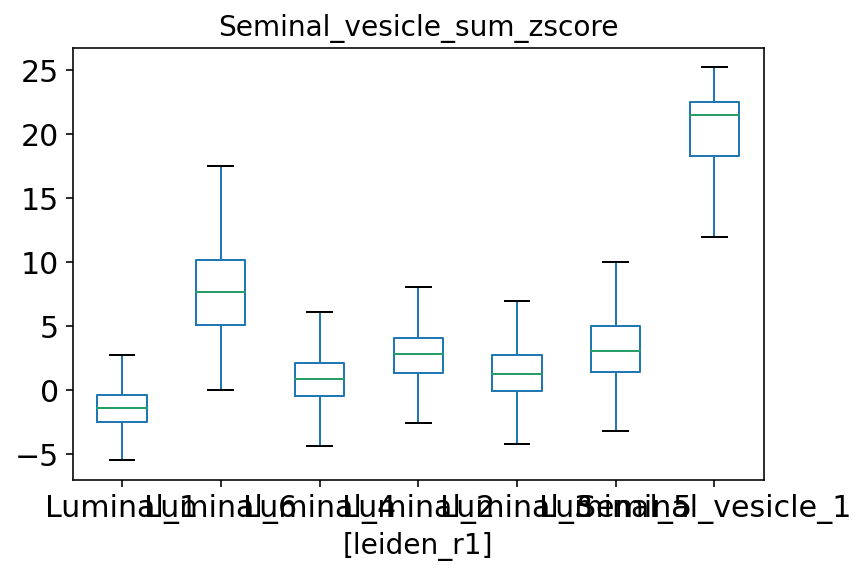

In [22]:
adata_luminals.obs.loc[:,['leiden_r1','Seminal_vesicle_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/Seminal_vesicle_sum_zscore.pdf")

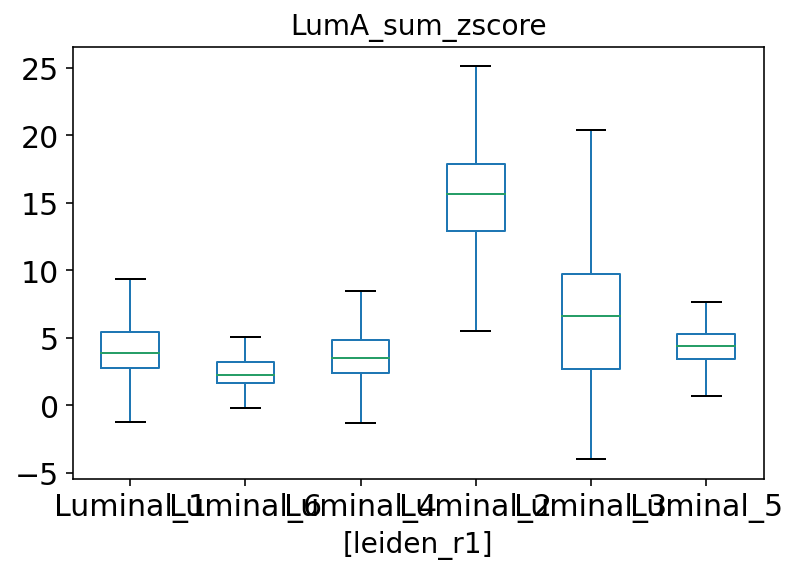

In [181]:
adata_luminals.obs.loc[:,['leiden_r1','LumA_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/LumA_sum_zscore.pdf")

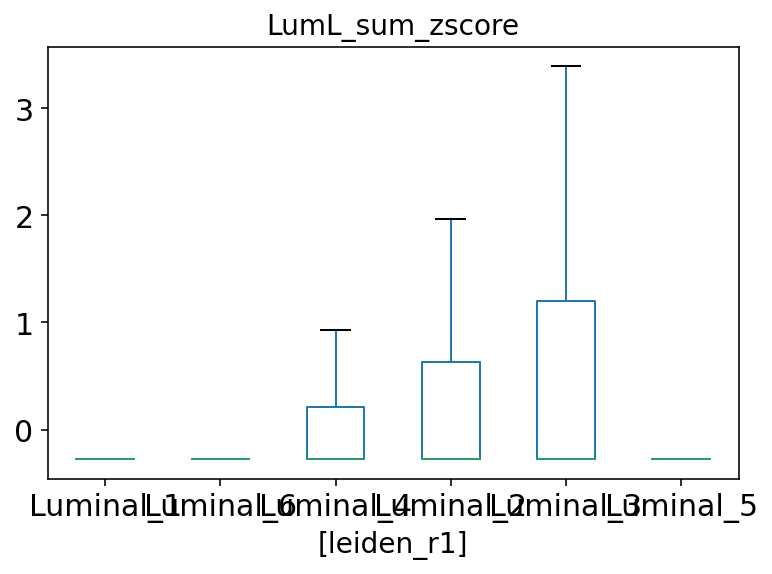

In [168]:
adata_luminals.obs.loc[:,['leiden_r1','LumL_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/LumL_sum_zscore.pdf")

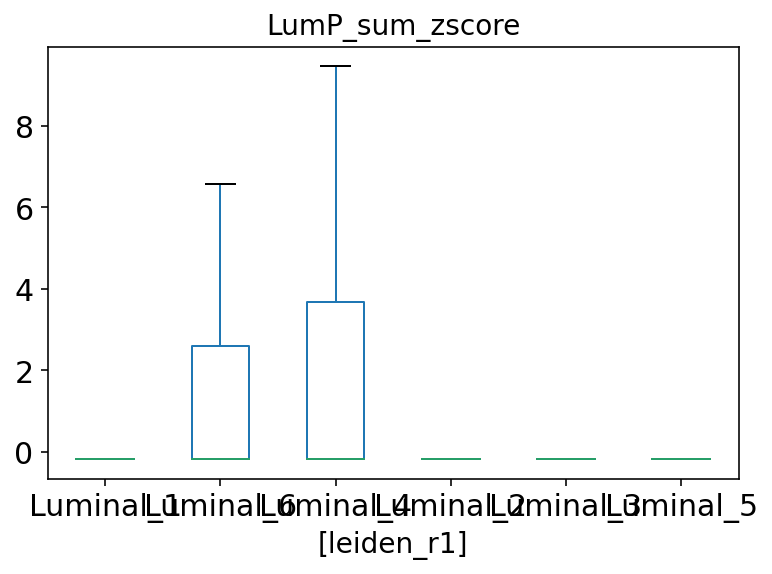

In [169]:
adata_luminals.obs.loc[:,['leiden_r1','LumP_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/LumP_sum_zscore.pdf")

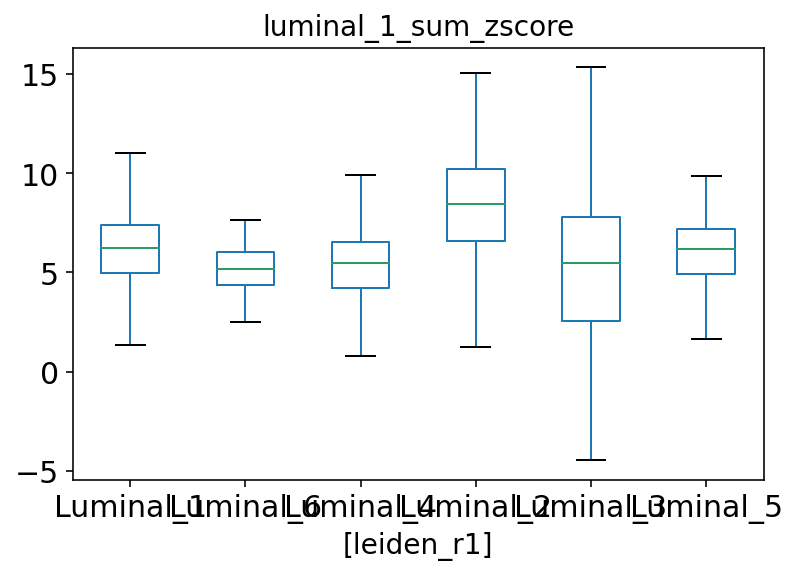

In [139]:
adata_luminals.obs.loc[:,['leiden_r1','luminal_1_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/luminal_1_sum_zscore.pdf")

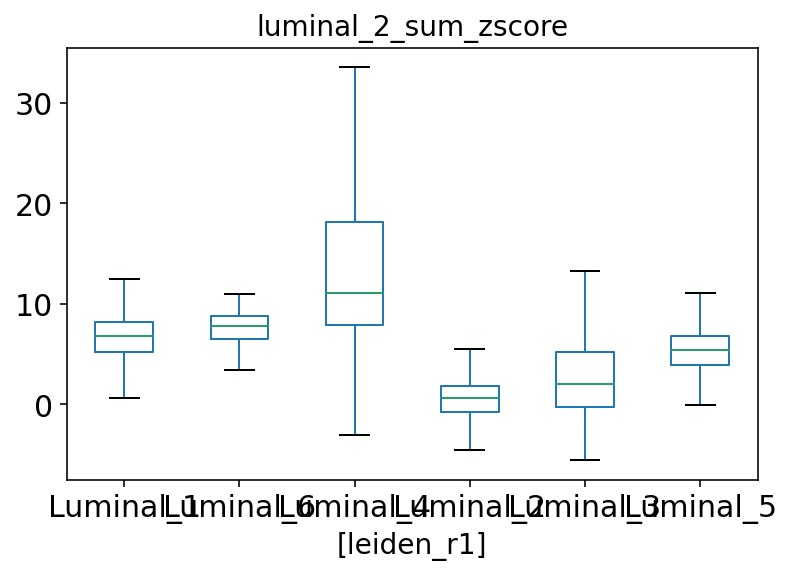

In [140]:
adata_luminals.obs.loc[:,['leiden_r1','luminal_2_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/luminal_2_sum_zscore.pdf")

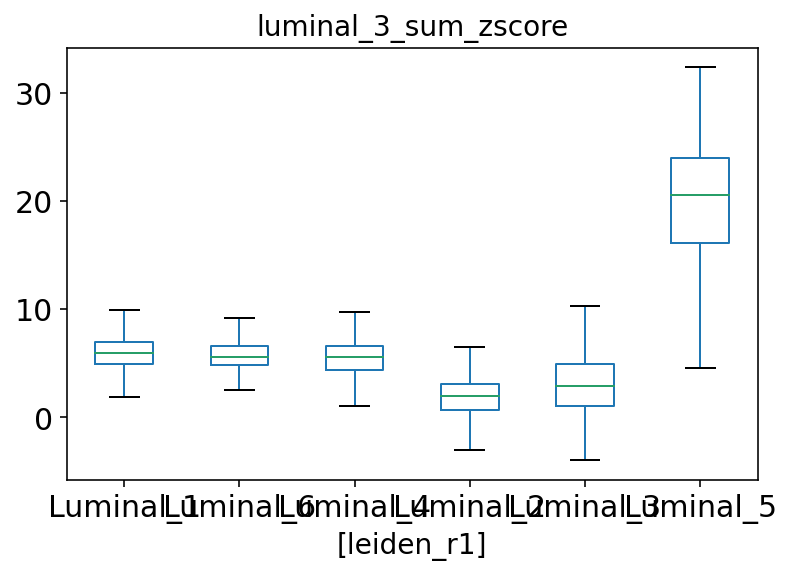

In [141]:
adata_luminals.obs.loc[:,['leiden_r1','luminal_3_sum_zscore']].boxplot(by='leiden_r1', grid=False, fontsize=15,showfliers=False)
plt.suptitle('')
plt.savefig("./figures/luminal_3_sum_zscore.pdf")

In [182]:
Tc_genes = pd.Series(Tc_genes, name='Tc_genes')
Th_genes = pd.Series(Th_genes, name='Th_genes')
Treg_genes = pd.Series(Treg_genes, name='Treg_genes')
M1_genes = pd.Series(M1_genes,name='M1_genes')
M2_genes = pd.Series(M2_genes,name='M2_genes')
MDSC_genes = pd.Series(MDSC_genes,name='MDSC_genes')

myofibroblast = pd.Series(myofibroblast, name='myofibroblast')
smooth_muscle = pd.Series(smooth_muscle, name='smooth_muscle')
mesenchymal_1 = pd.Series(mesenchymal_1, name='mesenchymal_1')
mesenchymal_2 = pd.Series(mesenchymal_2, name='mesenchymal_2')

luminal_1 = pd.Series(luminal_1, name='luminal_1')
luminal_2 = pd.Series(luminal_2, name='luminal_2')
luminal_3 = pd.Series(luminal_3, name='luminal_3')

LumA = pd.Series(LumA, name='Anterior_Prostate')
LumL = pd.Series(LumL, name='Lateral_Prostate')
LumV = pd.Series(LumV, name='Ventral_Prostate')
LumP = pd.Series(LumP, name='Proximal_Prostate')

markers = pd.concat([luminal_1, luminal_2, luminal_3, 
                     LumA, LumL, LumV, LumP,
                     mesenchymal_1, mesenchymal_2, myofibroblast,
                     M1_genes,M2_genes,MDSC_genes, Tc_genes, Th_genes, Treg_genes], axis=1)
markers

,luminal_1,luminal_2,luminal_3,Anterior_Prostate,Lateral_Prostate,Ventral_Prostate,Proximal_Prostate,mesenchymal_1,mesenchymal_2,myofibroblast,M1_genes,M2_genes,MDSC_genes,Tc_genes,Th_genes,Treg_genes
0,Epcam,Epcam,Epcam,Tgm4,Msmb,Trpv6,Ppp1r1b,Col5a2,Col5a2,Acta2,Il1b,Arg1,Arg1,Cd8a,Cd4,Cd4
1,Cd24a,Cd24a,Cd24a,Gsdma,NaN,NaN,NaN,Lama2,Lama2,Myh11,Il6,Mgl2,Cybb,Ptprc,Cxcr3,Il2ra
2,Krt8,Krt8,Krt8,Krt8,NaN,NaN,NaN,Zeb1,Zeb1,Acta2,Il12b,Retnla,Olr1,Icam1,Ccr4,Foxp3
3,Krt18,Krt18,Krt18,Cd24a,NaN,NaN,NaN,Wnt2,Sult1e1,Notch3,Inhba,Tmem26,Fut4,Cd28,Ccr6,NaN
4,Nkx3-1,Psca,Foxi1,Krt18,NaN,NaN,NaN,Wnt6,Fgf10,NaN,Tnf,Slc7a2,S100a8,NaN,Ccr10,NaN
5,Pbsn,Krt4,Atp6v1g3,Nkx3-1,NaN,NaN,NaN,Wnt10a,Rspo1,NaN,Nos2,Tmem26,S100a9,NaN,NaN,NaN
6,NaN,Tacstd2,NaN,Pbsn,NaN,NaN,NaN,Rorb,NaN,NaN,Ccr7,Socs2,Il10,NaN,NaN,NaN
7,NaN,Ly6a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Slc7a2,Ch25h,Tgfb1,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cxcl9,Flt1,Nos2,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Serpinb2,Pdcd1lg2,Stat3,NaN,NaN,NaN


In [184]:
markers.to_csv('markers.csv', index = False)

## imputation 

In [116]:
sc.external.pp.magic(adata, solver='approximate')

In [117]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_imputation.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata, f)

In [101]:
import pickle

# Getting back the objects:
with open('adata_imputation.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_imputation = pickle.load(f)

In [5]:
mycolormap_26 = ["#66cdaa","#0054b4","#966fd6","#aec6cf","red",
                "#ffb347","#e5aa70","#db7093","#cc99a2", "#03c03c",
                "#24F4FF", "#5a5a97", "#5b5da7", "#caae6b", "pink",
                 "#ba4747",  "yellow", "#555f6d", "gray", "#cc99a2",
                "#6f9dab", "#557100", "#caae6b", "#f1b929", "orange"]

In [6]:
import pickle

# Getting back the objects:
with open('adata_cluster_annotations3.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata = pickle.load(f)

In [107]:
np.sum(adata.var['gene_id'].isin(['Foxf1']))

1

In [7]:
adata.obs['leiden_r1'].cat.categories

Index(['Basal_1', 'Fibroblasts_1', 'Basal_2', 'Basal_3', 'Luminal_1',
       'Fibroblasts_2', 'Fibroblasts_3', 'Macrophage_1', 'Seminal_vesicle_1',
       'Luminal_2', 'Luminal_3', 'T_cells_1', 'Macrophage_2', 'Endothelial',
       'Fibroblasts_4', 'Luminal_4', 'Dendritic_cells', 'Basal_4', 'T_cells_2',
       'Luminal_5', 'Fibroblasts_5', 'Macrophage_3', 'Nerve_cells',
       'Luminal_6', 'Seminal_vesicle_2'],
      dtype='object')

In [26]:
adata_luminal = adata[adata.obs['leiden_r1'].isin(['Luminal_1', 'Luminal_2', 'Luminal_3', 'Luminal_4', 'Luminal_5', 'Luminal_6'])]
adata_basal = adata[adata.obs['leiden_r1'].isin(['Basal_1','Basal_2','Basal_3','Basal_4'])]
adata_stroma = adata[adata.obs['leiden_r1'].isin(['Fibroblasts_1', 'Fibroblasts_2','Fibroblasts_3','Fibroblasts_4', 'Fibroblasts_5'])]

/home/dan/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [ ]:
adata_luminal.obs['leiden_r1'].cat.reorder_categories(['Luminal_1', 'Luminal_2', 'Luminal_3', 'Luminal_4', 'Luminal_5', 'Luminal_6'], 
                                                      inplace=True)
adata_basal.obs['leiden_r1'].cat.reorder_categories(['Basal_1','Basal_2','Basal_3','Basal_4'], inplace=True)
adata_stroma.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_1', 'Fibroblasts_2','Fibroblasts_3','Fibroblasts_4', 'Fibroblasts_5'], inplace=True)

In [28]:
adata_stroma.var

,gene_id,2,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
EGFP3UTR,hETV4,Gene Expression,8841,True,0.245906,1.427165,8.125310,0.245906,0.592409
EGFP,EGFP,Gene Expression,9950,False,0.153405,0.834939,1.499609,0.153405,0.357888
CreERT2,CreERT2,Gene Expression,159,False,0.003175,1.236385,3.410800,0.003175,0.062651
EYFP,EYFP,Gene Expression,6487,True,0.261973,2.531236,19.763681,0.261973,0.814319
Xkr4,Xkr4,Gene Expression,17,False,0.000189,0.637956,-0.909263,0.000189,0.010987
...,...,...,...,...,...,...,...,...,...
AC168977.2,AC168977.2,Gene Expression,14,False,0.000167,0.733450,-0.387120,0.000167,0.011059
AC168977.1,AC168977.1,Gene Expression,162,False,0.001918,0.858370,0.165852,0.001918,0.040580
AC149090.1,AC149090.1,Gene Expression,7320,False,0.114098,0.929673,2.726850,0.114098,0.325690
CAAA01118383.1,CAAA01118383.1,Gene Expression,11698,False,0.158647,0.676830,-0.454938,0.158647,0.327685


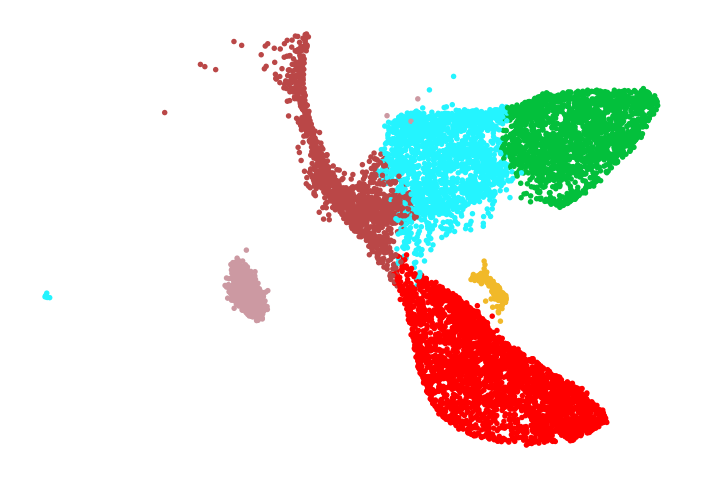

In [97]:
sc.pl.umap(adata_luminal, color='leiden_r1', size=30, legend_loc=None, 
           title = '', frameon=False,
           show = True, legend_fontsize = 10, save = 'adata_luminal.pdf')

In [ ]:
mycolormap_26 = ["#66cdaa","#0054b4","#966fd6","#aec6cf","red",
                "#ffb347","#e5aa70","#db7093","#cc99a2", "#03c03c",
                "#24F4FF", "#5a5a97", "#5b5da7", "#caae6b", "pink",
                 "#ba4747",  "yellow", "#555f6d", "gray", "#cc99a2",
                "#6f9dab", "#557100", "#caae6b", "#f1b929", "orange"]

In [39]:
sc.pl.umap(adata_basal, color='leiden_r1', size=30, legend_loc=None, 
           title = '', frameon=False,
           show = True, legend_fontsize = 5, save = 'adata_basal.pdf')

NameError: name 'adata_basal' is not defined

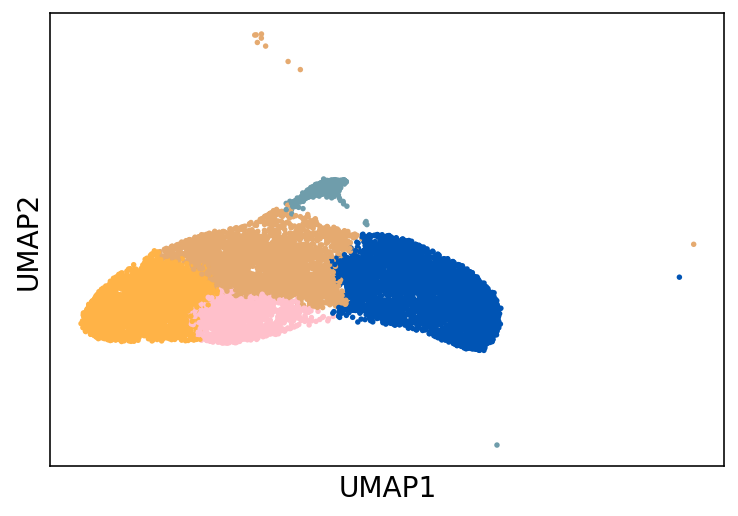

In [95]:
sc.pl.umap(adata_stroma, color='leiden_r1', size=30, legend_loc=None, 
           title = '', frameon=True,
           show = True, legend_fontsize = 5, save = 'adata_stroma.pdf')

In [127]:
sc.external.pp.magic(adata_luminal, solver='approximate')
sc.external.pp.magic(adata_basal, solver='approximate')
sc.external.pp.magic(adata_stroma, solver='approximate')

In [128]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_luminal_imputation.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_luminal, f)
    
with open('adata_basal_imputation.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_basal, f)
    
with open('adata_stroma_imputation.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_stroma, f)

In [234]:
import pickle

# Getting back the objects:
with open('adata_luminal_imputation.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_luminal_imputation = pickle.load(f)
    
with open('adata_basal_imputation.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_basal_imputation = pickle.load(f)
    
with open('adata_stroma_imputation.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_stroma_imputation = pickle.load(f)

In [235]:
# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata_luminal_imputation, min_cells=1)
sc.pp.filter_genes(adata_basal_imputation, min_cells=1)
sc.pp.filter_genes(adata_stroma_imputation, min_cells=1)

In [236]:
rawdata = adata_luminal_imputation.layers['counts']

In [237]:
rawdata

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 3., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 3., 0.]], dtype=float32)

In [238]:
# 9751 cells, 18101 genes
rawdata.shape

(9751, 18076)

In [239]:
sc.pp.scale(adata_luminal_imputation, zero_center=True, max_value=None, copy=False, layer=None, obsm=None)

In [240]:
np.mean(adata_luminal_imputation.X, axis = 0)

array([ 7.4880205e-08,  4.7767461e-08, -1.7951919e-07, ...,
        5.4442495e-08, -7.5301983e-08, -7.7661468e-08], dtype=float32)

In [242]:
from anndata import AnnData

#-- Select gene and duplicate in matrix
# idx = np.where(adata_luminal_imputation.var['gene_id'] == 'EGFP3UTR') # gene to be split into 2
idx_full = np.append(np.array([i for i in range(adata_luminal_imputation.n_vars)]), 0)
new_gexp = adata_luminal_imputation.X[:,idx_full]

new_gexp[:,0] = rawdata[:,0]
new_gexp[:,-1] = rawdata[:,0]
new_gexp[:,3] = rawdata[:,3]
#-- 'Split' expression by 'annot'
idx_samp = adata_luminal_imputation.obs['sample'] != 'EWT'
idx_samp2 = adata_luminal_imputation.obs['sample'] != 'TY'
idx_samp3 = adata_luminal_imputation.obs['sample'].isin(['E4A', 'E4Ap53'])

# create ETV4WT gene, only keep EWT and change the expression no less than 1
new_gexp[idx_samp,-1] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdata[:,0] == 0,-1] = 0

#change the ETV4AAA gene no less than 1, samples other than ETV4AAA to zero
new_gexp[~idx_samp,0] = 0
new_gexp[~idx_samp2,0] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdata[:,0] == 0, 0] = 0

#change the EYFP gene no less than 0, samples other than TY to zero
new_gexp[~idx_samp,3] = 0
new_gexp[idx_samp3,3] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdata[:,3] == 0, 3] = 0

#-- Create new adata
new_var = adata_luminal_imputation.var
new_var['gene_id'].cat.rename_categories({'hETV4': 'ETV4AAA'}, inplace = True)
new_var = new_var.append({'gene_id': 'ETV4WT'}, ignore_index = True)

adata_new = AnnData(new_gexp)
adata_new.var = new_var
adata_new.obs = adata_luminal_imputation.obs
adata_new.obsm = adata_luminal_imputation.obsm
adata_new.var.set_index('gene_id', inplace=True)

/home/dan/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


In [243]:
new_gexp.shape

(9751, 18077)

In [244]:
new_gexp[rawdata[:,0] == 0,-1]

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [245]:
mycolormap_26 = ["#66cdaa","#0054b4","#966fd6","#aec6cf","red",
                "#ffb347","#e5aa70","#db7093","#cc99a2", "#03c03c",
                "#24F4FF", "#5a5a97", "#5b5da7", "#caae6b", "pink",
                 "#ba4747",  "yellow", "#555f6d", "gray", "#cc99a2",
                "#6f9dab", "#557100", "#caae6b", "#f1b929", "orange"]

In [246]:
adata_new.obs['leiden_r1'].cat.reorder_categories(['Luminal_1','Luminal_6','Luminal_4','Luminal_2','Luminal_3','Luminal_5'],inplace = True)

<ipython-input-246-7ca02b2fd4ab>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_new.obs['leiden_r1'].cat.reorder_categories(['Luminal_1','Luminal_6','Luminal_4','Luminal_2','Luminal_3','Luminal_5'],inplace = True)


In [247]:
# luminal 1,6,4,2,3,5
mycolormap_luminal = ["red", "#f1b929", "#ba4747", "#03c03c", "#24F4FF", "#cc99a2"]

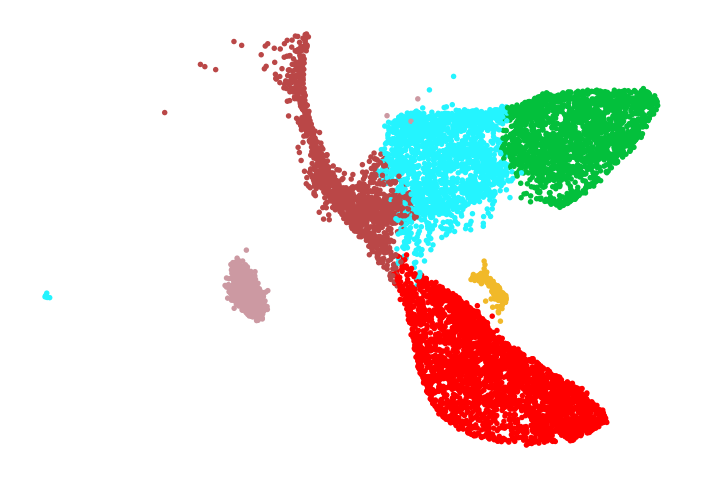

In [248]:
sc.pl.umap(adata_new, color='leiden_r1', size=30, legend_loc=None, 
           title = '', frameon=False,
           palette = mycolormap_luminal,
           show = True, legend_fontsize = 10, 
           save = 'adata_luminal_imputation2.pdf')

In [249]:
# prostate AD lobe 'Gsdma','Tgm4',
# prostate VP lobe 'Cldn10','Trpv6'
# Prostate LP lobe  'Msmb', 'Cldn10',
# prostate periurethral 'Cldn10','Trpv6'

Luminalmarkers1 = ['ETV4AAA','ETV4WT','EYFP', 'Dpp4', 'Ptgs1', 'Ly6a', 'Gprc5a', 'Sox9', 'Tacstd2', 'Psca','Krt4', 'Ppp1r1b', 'Pbsn', 
                   'Gsdma', 'Tgm4', 'Prom1', 'Msmb','Trpv6', 'Cldn10', 'Foxi1']
Luminalmarkers2 = ['ETV4AAA','ETV4WT','EYFP', 'Ar', 'Ptgs1', 'Gprc5a', 'Sox9', 'Gsdma', 'Tgm4','Msmb', 'Cldn10','Trpv6']
Luminalmarkers = ['ETV4AAA','ETV4WT','EYFP', 'Ly6a','Dpp4', 'Ptgs1', 'Gprc5a', 'Sox9', 'Prom1', 'Tacstd2', 'Psca','Ppp1r1b',
                 'Gsdma','Tgm4','Msmb', 'Cldn10','Trpv6', 'Foxi1']
Basalmarkers = ['ETV4AAA','ETV4WT','EYFP', 'Col17a1','Areg', 'Ly6d', 'Krt5','Krt14','Trp63','Cd44']
Stromamarkers = ['ETV4AAA','ETV4WT','EYFP', 'Wnt2','Wnt10a','Nrg2', 'Igf1','Rspo1','Fgf10', 'Igfbp7','Cald1','Gadd45b']

In [250]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_new_luminal2.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_new, f)

In [3]:
import pickle

# Getting back the objects:
with open('adata_new_luminal2.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_new = pickle.load(f)

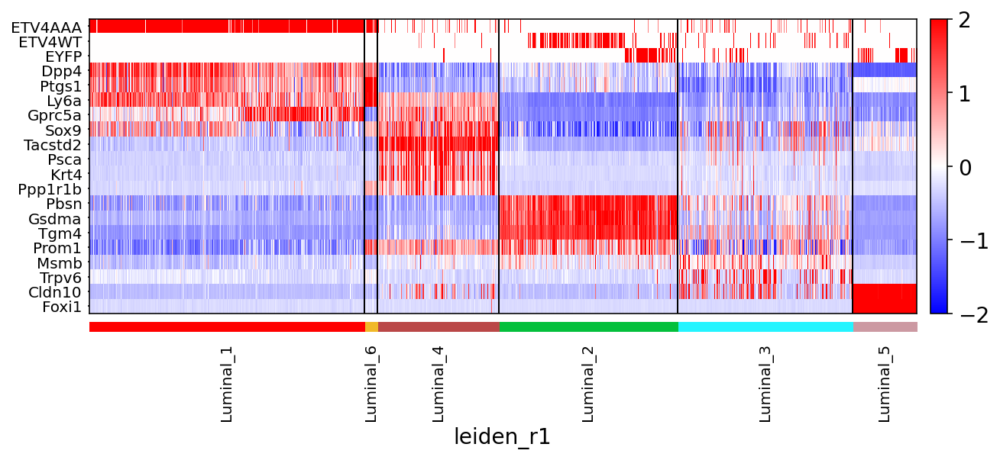

In [251]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new, Luminalmarkers1, groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Luminalmarkers_imputation3.pdf")

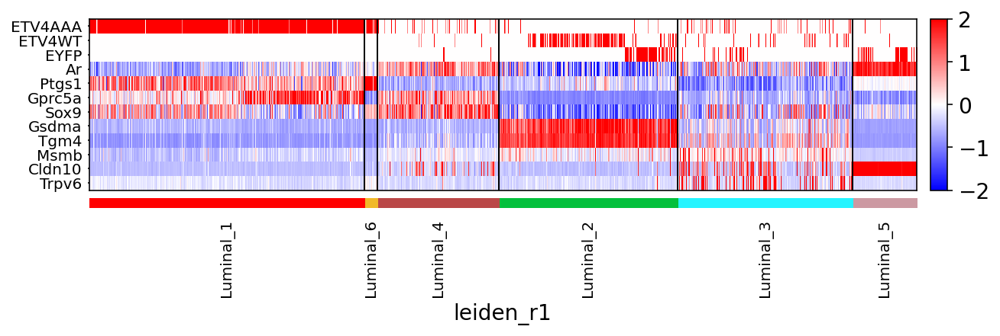

In [252]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new, Luminalmarkers2, groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, save = "Luminalmarkers2_imputation3.pdf")

In [253]:
adata_basal_imputation.var

,gene_id,2,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
EGFP3UTR,hETV4,Gene Expression,2234,True,0.245906,1.427165,8.125310,0.245906,0.592409
EGFP,EGFP,Gene Expression,7082,False,0.153405,0.834939,1.499609,0.153405,0.357888
CreERT2,CreERT2,Gene Expression,5,False,0.003175,1.236385,3.410800,0.003175,0.062651
EYFP,EYFP,Gene Expression,6313,True,0.261973,2.531236,19.763681,0.261973,0.814319
Mrpl15,Mrpl15,Gene Expression,4965,False,0.135865,0.626101,-1.082051,0.135865,0.291659
...,...,...,...,...,...,...,...,...,...
AC168977.2,AC168977.2,Gene Expression,466,False,0.000167,0.733450,-0.387120,0.000167,0.011059
AC168977.1,AC168977.1,Gene Expression,4807,False,0.001918,0.858370,0.165852,0.001918,0.040580
AC149090.1,AC149090.1,Gene Expression,227,False,0.114098,0.929673,2.726850,0.114098,0.325690
CAAA01118383.1,CAAA01118383.1,Gene Expression,874,False,0.158647,0.676830,-0.454938,0.158647,0.327685


In [254]:
rawdatabasal = adata_basal_imputation.layers['counts']

In [255]:
sc.pp.scale(adata_basal_imputation, zero_center=True, max_value=None, copy=False, layer=None, obsm=None)

In [256]:
adata_basal_imputation.X.shape

(14467, 17288)

In [257]:
# for basal cells

from anndata import AnnData
#-- Select gene and duplicate in matrix
# idx = np.where(adata_luminal_imputation.var['gene_id'] == 'EGFP3UTR') # gene to be split into 2
idx_full = np.append(np.array([i for i in range(adata_basal_imputation.n_vars)]), 0)
new_gexp = adata_basal_imputation.X[:,idx_full]

new_gexp[:,0] = rawdatabasal[:,0]
new_gexp[:,-1] = rawdatabasal[:,0]
new_gexp[:,3] = rawdatabasal[:,3]

#-- 'Split' expression by 'annot'
idx_samp = adata_basal_imputation.obs['sample'] != 'EWT'
idx_samp2 = adata_basal_imputation.obs['sample'] != 'TY'
idx_samp3 = adata_basal_imputation.obs['sample'].isin(['E4A', 'E4Ap53'])

# create ETV4WT gene, only keep EWT and change the expression no less than 1
#new_gexp[rawdatabasal[:,0] > 0, -1] = 2
new_gexp[idx_samp,-1] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatabasal[:,0] == 0,-1] = 0

#change the ETV4AAA gene no less than 1, samples other than ETV4AAA to zero
#new_gexp[rawdatabasal[:,0] > 0, 0] = 2
new_gexp[~idx_samp,0] = 0
new_gexp[~idx_samp2,0] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatabasal[:,0] == 0, 0] = 0

#change the EYFP gene no less than 0, samples other than TY to zero
#new_gexp[rawdatabasal[:,3] > 0, 3] = 2
new_gexp[~idx_samp,3] = 0
new_gexp[idx_samp3,3] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatabasal[:,3] == 0, 3] = 0


#-- Create new adata
new_var = adata_basal_imputation.var
new_var['gene_id'].cat.rename_categories({'hETV4': 'ETV4AAA'}, inplace = True)
new_var = new_var.append({'gene_id': 'ETV4WT'}, ignore_index = True)

adata_new = AnnData(new_gexp)
adata_new.var = new_var
adata_new.obs = adata_basal_imputation.obs
adata_new.obsm = adata_basal_imputation.obsm
adata_new.var.set_index('gene_id', inplace=True)

/home/dan/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


In [258]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_new_basal2.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_new, f)

In [4]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_new_basal2.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_new_basal = pickle.load(f)

In [5]:
adata_new_basal.obs['leiden_r1'].cat.reorder_categories(['Basal_2','Basal_3','Basal_1','Basal_4'],inplace = True)

<ipython-input-5-127b0b040edd>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_new_basal.obs['leiden_r1'].cat.reorder_categories(['Basal_2','Basal_3','Basal_1','Basal_4'],inplace = True)


In [6]:
adata_new_basal.obs['leiden_r1'].cat.categories

Index(['Basal_2', 'Basal_3', 'Basal_1', 'Basal_4'], dtype='object')

In [7]:
mycolormap_basal = ["#966fd6", "#aec6cf", "#66cdaa", "#555f6d"]

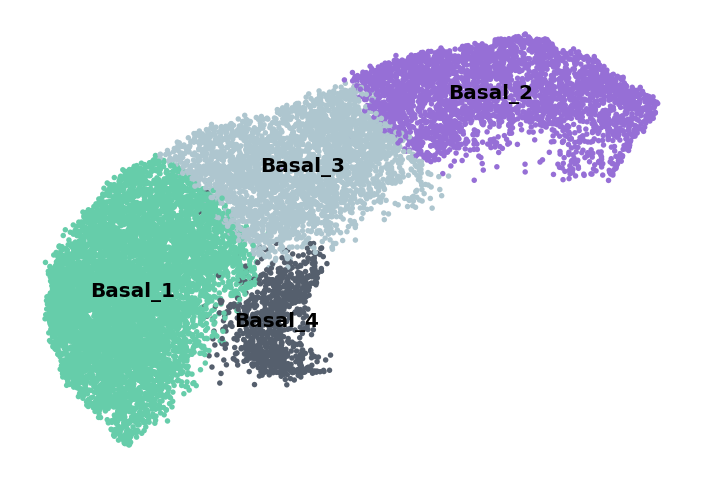

In [8]:
sc.pl.umap(adata_new_basal, color='leiden_r1', size=30, legend_loc='on data', 
           title = '', frameon=False,
           palette = mycolormap_basal,
           show = True, legend_fontsize = 10, 
           save = 'adata_basal_imputation2.pdf')

In [9]:
adata_new_basal.obs['leiden_r1']

AGCGGTCAGACTGTAA      Basal_1
AAACGGGAGTTGAGAT      Basal_1
AAACGGGTCCACGAAT      Basal_1
AAAGATGCACAGAGGT      Basal_3
AACCATGGTGGTAACG      Basal_1
                       ...   
ACTGTCCTCACTTACT      Basal_4
CGTCCATGTAGATTAG-1    Basal_1
CTACACCGTGAGTATA      Basal_4
CTCGTCATCTTACCGC      Basal_4
CGGGTCAAGACCCACC      Basal_4
Name: leiden_r1, Length: 14467, dtype: category
Categories (4, object): ['Basal_2', 'Basal_3', 'Basal_1', 'Basal_4']

In [14]:
Basalmarkers = ['Ar','Col17a1','Areg', 'Ly6d', 'Krt5','Krt14','Trp63','Cd44']
Stromamarkers = ['Ar','Wnt2','Wnt10a','Nrg2', 'Igf1','Rspo1','Fgf10', 'Igfbp7','Cald1','Gadd45b']

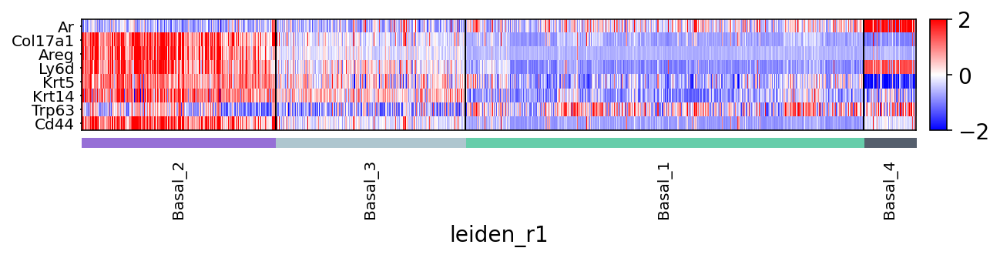

In [15]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_basal, Basalmarkers, groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Basalmarkers_imputation4.pdf")

In [265]:
rawdatastr = adata_stroma_imputation.layers['counts']

In [273]:
rawdatastr

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [266]:
sc.pp.scale(adata_stroma_imputation, zero_center=True, max_value=None, copy=False, layer=None, obsm=None)

In [267]:
adata_stroma_imputation.var

,gene_id,2,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
EGFP3UTR,hETV4,Gene Expression,150,True,0.245906,1.427165,8.125310,-0.230964,0.094937
EGFP,EGFP,Gene Expression,7,False,0.153405,0.834939,1.499609,-0.349052,0.048281
EYFP,EYFP,Gene Expression,2378,True,0.261973,2.531236,19.763681,-0.126403,0.134685
Xkr4,Xkr4,Gene Expression,8803,False,0.000189,0.637956,-0.909263,0.043969,0.091188
Rp1,Rp1,Gene Expression,1652,False,0.000260,0.924591,0.658009,-0.012012,0.012050
...,...,...,...,...,...,...,...,...,...
AC168977.2,AC168977.2,Gene Expression,1858,False,0.000167,0.733450,-0.387120,-0.009631,0.022144
AC168977.1,AC168977.1,Gene Expression,714,False,0.001918,0.858370,0.165852,-0.032923,0.026558
AC149090.1,AC149090.1,Gene Expression,3116,False,0.114098,0.929673,2.726850,-0.090609,0.137000
CAAA01118383.1,CAAA01118383.1,Gene Expression,1389,False,0.158647,0.676830,-0.454938,-0.097905,0.079362


In [274]:
from anndata import AnnData
#-- Select gene and duplicate in matrix
# idx = np.where(adata_luminal_imputation.var['gene_id'] == 'EGFP3UTR') # gene to be split into 2
idx_full = np.append(np.array([i for i in range(adata_stroma_imputation.n_vars)]), 0)
new_gexp = adata_stroma_imputation.X[:,idx_full]

new_gexp[:,0] = rawdatastr[:,0]
new_gexp[:,-1] = rawdatastr[:,0]
new_gexp[:,2] = rawdatastr[:,2]

#-- 'Split' expression by 'annot'
idx_samp = adata_stroma_imputation.obs['sample'] != 'EWT'
idx_samp2 = adata_stroma_imputation.obs['sample'] != 'TY'
idx_samp3 = adata_stroma_imputation.obs['sample'].isin(['E4A', 'E4Ap53'])

# create ETV4WT gene, only keep EWT and change the expression no less than 1
# new_gexp[rawdatastr[:,0] > 0, -1] = 2
new_gexp[idx_samp,-1] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatastr[:,0] == 0,-1] = 0

#change the ETV4AAA gene no less than 1, samples other than ETV4AAA to zero
#new_gexp[rawdatastr[:,0] > 0, 0] = 2
new_gexp[~idx_samp,0] = 0
new_gexp[~idx_samp2,0] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatastr[:,0] == 0, 0] = 0

#change the EYFP gene no less than 0, samples other than TY to zero
#new_gexp[rawdatastr[:,3] > 0, 3] = 2
new_gexp[~idx_samp,3] = 0
new_gexp[idx_samp3,3] = 0
#if the expression is 0 in raw, then change it to 0
new_gexp[rawdatastr[:,3] == 0, 3] = 0

#-- Create new adata
new_var = adata_stroma_imputation.var
new_var['gene_id'].cat.rename_categories({'hETV4': 'ETV4AAA'}, inplace = True)
new_var = new_var.append({'gene_id': 'ETV4WT'}, ignore_index = True)
adata_new_stroma = AnnData(new_gexp)
adata_new_stroma.var = new_var
adata_new_stroma.obs = adata_stroma_imputation.obs
adata_new_stroma.obsm = adata_stroma_imputation.obsm
adata_new_stroma.var.set_index('gene_id', inplace=True)

In [110]:
mycolormap_stroma = ["#ffb347","#0054b4","#e5aa70","pink","#6f9dab"]

In [276]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_new_stroma2.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(adata_new_stroma, f)

In [16]:
import pickle

# obj0, obj1, obj2 are created here...

# Saving the objects:
with open('adata_new_stroma2.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    adata_new_stroma = pickle.load(f)

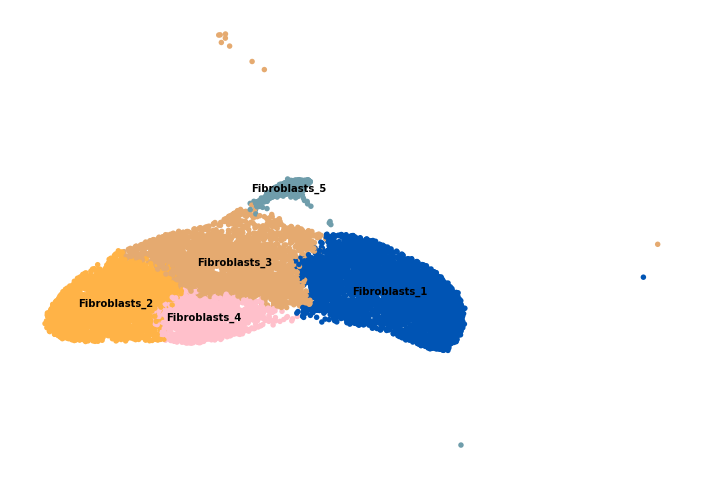

In [111]:
sc.pl.umap(adata_new_stroma, color='leiden_r1', size=30, 
           legend_loc='on data', 
           title = '', frameon=False,
           palette = mycolormap_stroma,
           show = True, legend_fontsize = 5, 
           save = 'adata_stroma_imputation.pdf')

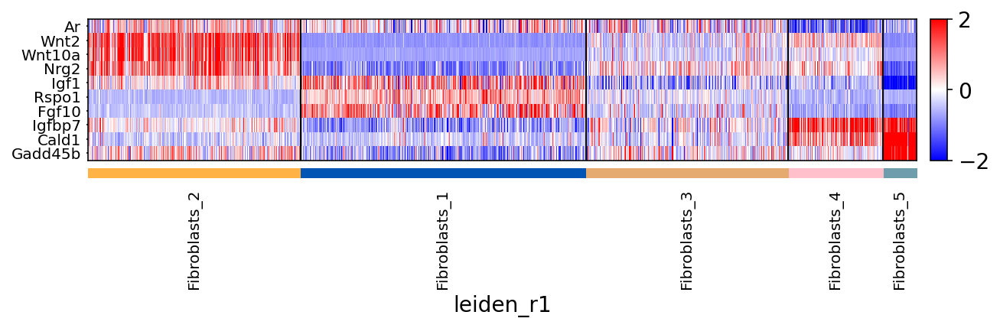

In [117]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, Stromamarkers, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_imputation5.pdf")

In [22]:
mesenchymal_1 = ['Lama2', 'Zeb1', 'Wnt2', 'Wnt6', 'Wnt10a', 'Rorb']

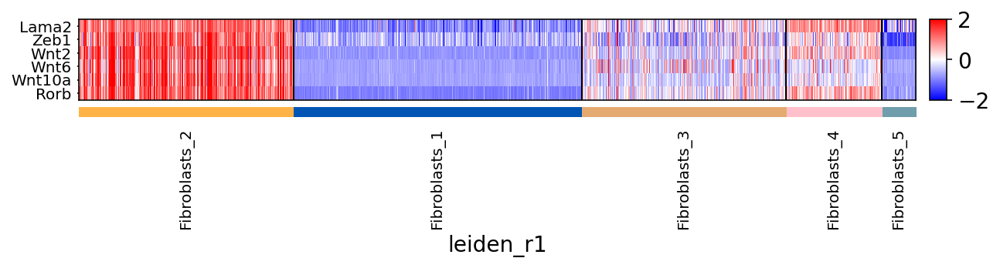

In [116]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, mesenchymal_1, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_mesenchymal_1.pdf")

In [24]:
mesenchymal_2 = ['Col5a2', 'Sult1e1', 'Fgf10', 'Rspo1']

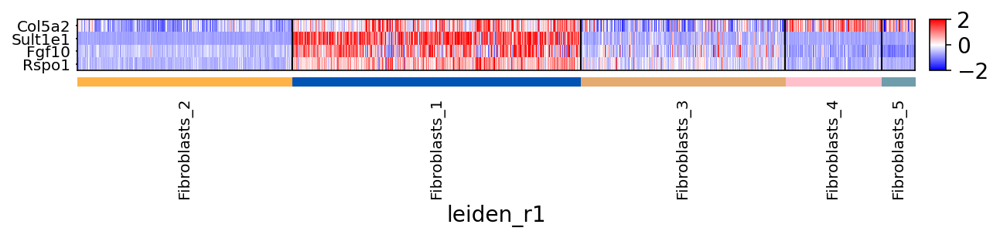

In [115]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, mesenchymal_2, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_mesenchymal_2.pdf")

In [26]:
myofibroblast = ['Acta2', 'Myh11', 'Rspo3']

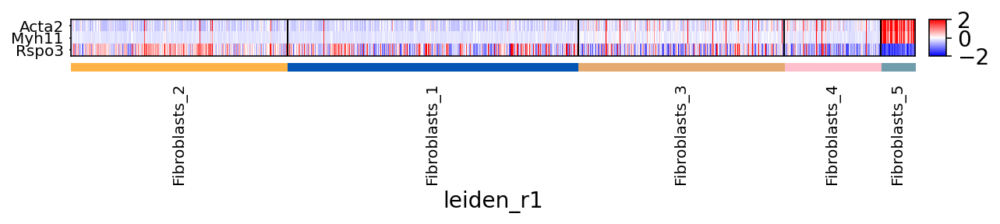

In [114]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, myofibroblast, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_myofibroblast.pdf")

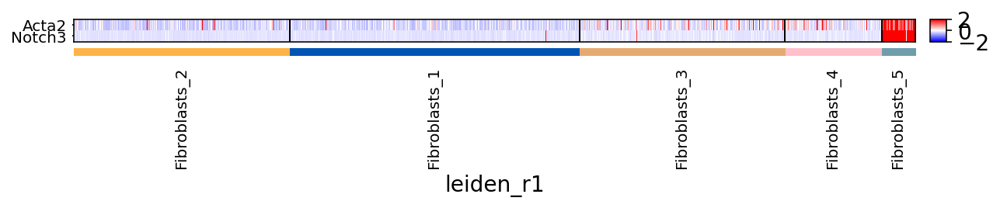

In [113]:
smooth_muscle = ['Acta2', 'Notch3']
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, smooth_muscle, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_smooth_muscle.pdf")

In [95]:
stroma_markers = ['Lama2', 'Zeb1', 'Wnt2', 'Wnt6', 'Wnt10a', 'Rorb', 'Nrg2',
                 'Sult1e1', 'Fgf10', 'Rspo1', 'Col5a2', 
                  'Sod3','Osr1',
                  'Mgp','Bgn','Igfbp7','Col6a1',
                 'Acta2', 'Myh11', 'Notch3', 'Gadd45b']

In [97]:
adata_new_stroma.obs['leiden_r1']

AATCCAGAGAGGTAGA    Fibroblasts_2
ACATACGAGTTTGCGT    Fibroblasts_2
ACATACGGTTACTGAC    Fibroblasts_2
ACGGCCATCAAAGTAG    Fibroblasts_1
AGCAGCCTCATGTCTT    Fibroblasts_2
                        ...      
CGGAGTCTCGACGGAA    Fibroblasts_3
GGTGTTACAAGTCATC    Fibroblasts_3
GCAGCCATCGGACAAG    Fibroblasts_1
TACACGATCGAACTGT    Fibroblasts_1
ACCGTAACATGCATGT    Fibroblasts_1
Name: leiden_r1, Length: 12591, dtype: category
Categories (5, object): ['Fibroblasts_1', 'Fibroblasts_2', 'Fibroblasts_3', 'Fibroblasts_4', 'Fibroblasts_5']

In [98]:
adata_new_stroma.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2',
                                                          'Fibroblasts_1',
                                                          'Fibroblasts_3','Fibroblasts_4','Fibroblasts_5'],inplace = True)

<ipython-input-98-2d6a85ac0723>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_new_stroma.obs['leiden_r1'].cat.reorder_categories(['Fibroblasts_2',


In [99]:
adata_new_stroma.obs['leiden_r1']

AATCCAGAGAGGTAGA    Fibroblasts_2
ACATACGAGTTTGCGT    Fibroblasts_2
ACATACGGTTACTGAC    Fibroblasts_2
ACGGCCATCAAAGTAG    Fibroblasts_1
AGCAGCCTCATGTCTT    Fibroblasts_2
                        ...      
CGGAGTCTCGACGGAA    Fibroblasts_3
GGTGTTACAAGTCATC    Fibroblasts_3
GCAGCCATCGGACAAG    Fibroblasts_1
TACACGATCGAACTGT    Fibroblasts_1
ACCGTAACATGCATGT    Fibroblasts_1
Name: leiden_r1, Length: 12591, dtype: category
Categories (5, object): ['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4', 'Fibroblasts_5']

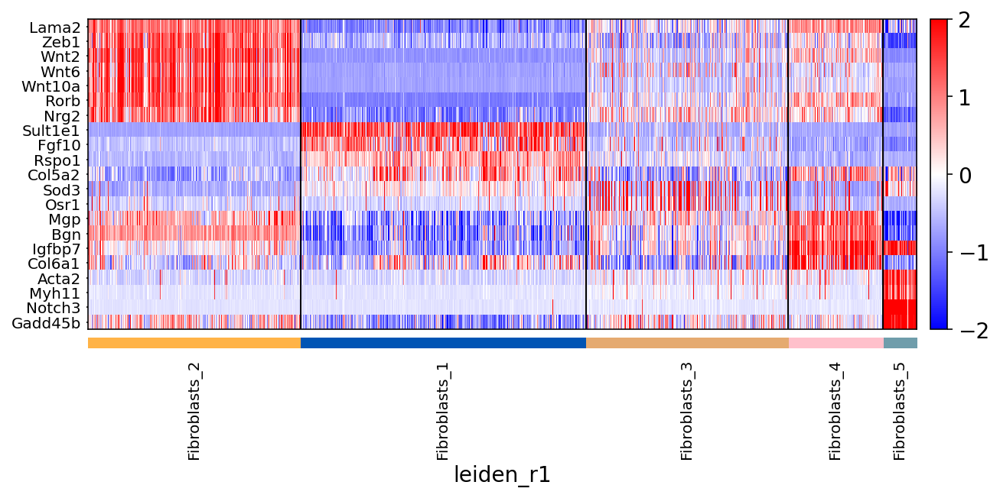

In [112]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, stroma_markers, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_stroma_markers2.pdf")

In [108]:
adata_new_stroma.obs['leiden_r1']

AATCCAGAGAGGTAGA    Fibroblasts_2
ACATACGAGTTTGCGT    Fibroblasts_2
ACATACGGTTACTGAC    Fibroblasts_2
ACGGCCATCAAAGTAG    Fibroblasts_1
AGCAGCCTCATGTCTT    Fibroblasts_2
                        ...      
CGGAGTCTCGACGGAA    Fibroblasts_3
GGTGTTACAAGTCATC    Fibroblasts_3
GCAGCCATCGGACAAG    Fibroblasts_1
TACACGATCGAACTGT    Fibroblasts_1
ACCGTAACATGCATGT    Fibroblasts_1
Name: leiden_r1, Length: 12591, dtype: category
Categories (5, object): ['Fibroblasts_2', 'Fibroblasts_1', 'Fibroblasts_3', 'Fibroblasts_4', 'Fibroblasts_5']

In [87]:
markers = ['Mfap4',
'Meg3',
'Fst',
'Inmt',
'Sparcl1',
'Lum',
'Plac8',
'Nr4a2',
'Dpt',
'Sod3',
'Rgcc',
'Ccdc80',
'Phlda1',
'Map1b',
'Pmepa1',
'Fbln1',
'Tspan8',
'Akap12',
'Fgl2',
'Csrp2',
'Maff',
'Eif4e',
'Errfi1',
'Tnfrsf12a',
'Gas1',
'Ptgs2',
'Hmox1',
'Vcam1',
'Mdk',
'Osr1',
'Ugdh',
'Hspb8',
'Pdlim3',
'Ctla2a'
]

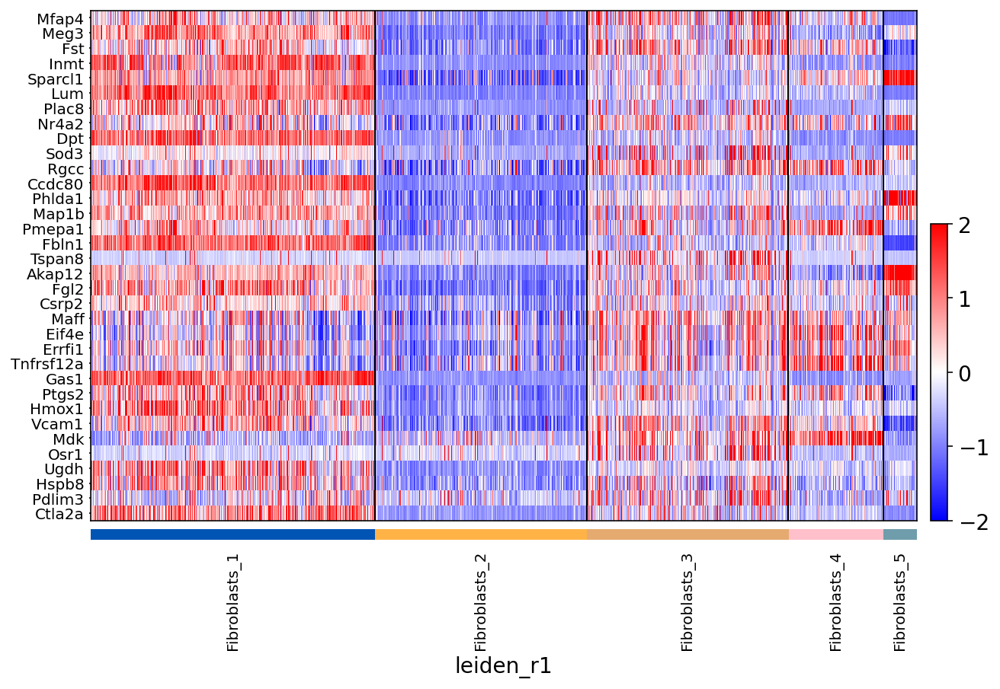

In [88]:
plt.rcParams.update({'font.size': 12})
sc.pl.heatmap(adata_new_stroma, markers, 
              groupby='leiden_r1', 
              use_raw=False,
              vmin=-2, vmax=2, show_gene_labels= True,
              cmap='bwr', dendrogram=False, swap_axes=True, 
              save = "Stromamarkers_stroma_markers_3.pdf")